# ERC-4626: best performing stablecoin vaults

This is a [research notebook](https://tradingstrategy.ai/glossary/jupyter-notebook) for listing and analysing ERC-4626 vaults.

- In this notebook, we examine different [ERC-4626 vaults](https://tradingstrategy.ai/glossary/erc-4626) across different [EVM blockchains](https://tradingstrategy.ai/glossary/evm-compatible)
    - We analyse the vault performance by its share price, as reported by ERC-4626 smart contract interface.    
    - We separate lending vaults (risk free) and volatile vaults (with drawdown)
    - We do last three months and historical all-time analyses
    - We look [quantitative finance](https://tradingstrategy.ai/glossary/quantitative-finance) aspects of the vaults like [returns](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr), [Sharpe](https://tradingstrategy.ai/glossary/sharpe) and [Sortino](https://tradingstrategy.ai/glossary/sortino) numbers    

### Notes and disclaimers

- Because of how vault metrics, share price and such are collected and interpreted, the results in this notebook contain various inaccuracies.
- In this notebook, we use terms Net Asset Value (NAV) and [Total Value Locked (TVL)](https://tradingstrategy.ai/glossary/total-value-locked-tvl) interchangeably.

## Usage

- First you need the data. See *ERC-4626: scanning vault data* tutorial to get the data locally.
- Then just run this notebook in Visual Studio Code.

For any questions, follow and contact [Trading Strategy community](https://tradingstrategy.ai/community).

## Vault notes

For the context of research, here are miscellaneous comments on the vaults in this notebook:

- [About gTRADE (formerly Gains Network)](https://gains.trade/vaults/gDAI): Market making vaults for gTRADE. Deposit DAI/USDC in exchange for gDAI, an ERC-20 representing your ownership in the vault. Stakers receive fees from each trade placed on the platform in exchange for serving as the counterparty to all trades. gDAI accumulates these fees in real-time.

- [About Ostium Vault (ostiumLP)](https://ostium.app/vault): Ostium is a real-world asset perp protocol. Earn fractional trading and liquidation fees with $OLP by providing liquidity with staked USDC. This pool acts as the ultimate backstop for trade settlement.

- [About 40acres](https://www.40acres.finance/): 40acres finance is NFT lending protocol (use NFTs as collateral). The vault named "Vault" on Base is by 40acres, they just forget the name their vault in idenfiable manner.

- [About Revert Lend](https://revert.finance/#/lending): Revert Lend borrows to Uniswap v3 market makers. Earn a variable interest by lending USDC to AMM LPs.  It allows users to collateralize their Uniswap v3 liquidity provider positions, in the form of the Uniswap NFTManager NFTs, and obtain loans in a protocol-determined ERC-20 token. The protocol is specifically designed to allow Liquidity Providers to maintain control over the capital in their positions while they are collateralized. This feature facilitates uninterrupted management and optimization of LP positions, catering to the dynamic needs of liquidity providers.

- [About Peapods](https://peapods.finance/app): Peapods pioneered the concept of Volatility Farming; The ability to bring together two uncorrelated assets into an LP position to farm the volatility between the assets and tokenize it as yield. protocols, or earning fees from wrapping/unwrapping.

- [About D2.finance and HYPE++](https://gitbook.d2.finance/): D2 Finance is provides Tokenized DeFi Derivatives Strategies delivering superior risk-adjusted returns, with full on-chain transparency. HYPE++ vault is an Arbitrum vault that trades on Hyperliquid through briding. HYPE++ will take advantage of the current funding rate arbitrage to provide boosted risk-adjusted returns. The hedging mechanism using so called “Ghost VC tokens” provides a risk management layer. HYPE++ identifies and shorts tokens which are overvalued in the market creating an inverse position which can offset potential market downturns, effectively reducing strategy market beta risk. 

- [About dgnHYPE](https://www.dsquaredcap.com/): A proprietary trading strategy "DSquared Investment Vault V0 " by D Squared Capital. 
DSQ is a global investment firm employing a differentiated investment strategy to some of the world’s most exciting companies. We act as a transformative capital source to businesses, providing founders and companies solutions that offer value creation across ever changing markets.


## Setup

- Set up notebook rendering output mode
- Use static image charts so this notebook is readeable on Github / ReadTheDocs

In [1]:
import pandas as pd
from plotly.offline import init_notebook_mode
import plotly.io as pio

from eth_defi.research.notebook import set_large_plotly_chart_font

pd.options.display.float_format = "{:,.2f}".format
pd.options.display.max_columns = None
pd.options.display.max_rows = None


# Set up Plotly chart output as SVG
image_format = "png"
width = 1400
height = 800

# https://stackoverflow.com/a/52956402/315168
init_notebook_mode()

# https://stackoverflow.com/a/74609837/315168
assert hasattr(pio, "kaleido"), "Kaleido rendering backend missing. Run 'pip install kaleido' needed for this notebook"
pio.kaleido.scope.default_format = image_format

# https://plotly.com/python/renderers/#overriding-the-default-renderer
pio.renderers.default = image_format

current_renderer = pio.renderers[image_format]
current_renderer.width = width
current_renderer.height = height

# Set all Plotly charts to use large font sizes for better readability,
# for sharing on mobile
set_large_plotly_chart_font(line_width=5, legend_font_size=16)
pio.templates.default = "custom"

/var/folders/8n/h2dzh5yx5470cc6c_12dwrjw0000gn/T/ipykernel_33268/2490398170.py:22: DeprecationWarning:


Use of plotly.io.kaleido.scope.default_format is deprecated and support will be removed after September 2025.
Please use plotly.io.defaults.default_format instead.




## Read previously scanned vault price data

- Read the Parquet file produced earlier with price scan 
- The `cleaned-vault-prices-1h.parquet` contains 
    - Only stablecoin vaults
    - Precalculated performance metrics for the vaults

In [2]:
from eth_defi.vault.vaultdb import VaultDatabase

# Load from the default location on local filesystem
vault_db = VaultDatabase.read()

print(f"We have data for {vault_db.get_lead_count()} potential vaults")

We have data for 22717 potential vaults


In [3]:
from pathlib import Path

output_folder = Path("~/.tradingstrategy/vaults").expanduser()
parquet_file = output_folder / "cleaned-vault-prices-1h.parquet"
assert parquet_file.exists(), "Run the vault scanner script first"

try:
    prices_df = pd.read_parquet(parquet_file)
except Exception as e:
    raise RuntimeError(f"Could not read: {parquet_file}: {e}") from e

chains = prices_df["chain"].unique()

print(f"We have {len(prices_df):,} price rows and {vault_db.get_lead_count()} vault metadata entries for {len(chains)} chains")

sample_vault = next(iter(vault_db.rows.values()))
print("We have vault metadata keys: ", ", ".join(c for c in sample_vault.keys()))

print("We have prices DataFrame columns: ", ", ".join(c for c in prices_df.columns))
print("DataFrame sample:")
display(prices_df.head())

We have 11,425,880 price rows and 22717 vault metadata entries for 20 chains
We have vault metadata keys:  Symbol, Name, Address, Denomination, NAV, Protocol, Mgmt fee, Perf fee, Shares, First seen, _detection_data, _denomination_token, _share_token
We have prices DataFrame columns:  chain, address, block_number, share_price, total_assets, total_supply, performance_fee, management_fee, errors, id, name, event_count, protocol, raw_share_price, pct_change_prev, pct_change_next, returns_1h, avg_assets_by_vault, dynamic_tvl_threshold, tvl_filtering_mask
DataFrame sample:


,chain,address,block_number,share_price,total_assets,total_supply,performance_fee,management_fee,errors,id,name,event_count,protocol,raw_share_price,pct_change_prev,pct_change_next,returns_1h,avg_assets_by_vault,dynamic_tvl_threshold,tvl_filtering_mask
timestamp,,,,,,,,,,,,,,,,,,,,
2025-03-20 13:13:35,1,0x00000000efe883b3304aff71eacf72dbc3e1b577,22088299,1.00,"273,058.28","273,058.28",NaN,NaN,,1-0x00000000efe883b3304aff71eacf72dbc3e1b577,Resupply Insurance Pool,1903,<unknown ERC-4626>,1.00,NaN,0.00,0.00,"29,148,240.45","582,964.81",True
2025-03-20 14:13:35,1,0x00000000efe883b3304aff71eacf72dbc3e1b577,22088599,1.00,"1,056,686.93","1,056,686.93",NaN,NaN,,1-0x00000000efe883b3304aff71eacf72dbc3e1b577,Resupply Insurance Pool,1903,<unknown ERC-4626>,1.00,0.00,0.00,0.00,"29,148,240.45","582,964.81",True
2025-03-20 15:13:47,1,0x00000000efe883b3304aff71eacf72dbc3e1b577,22088899,1.00,"2,897,835.96","2,897,835.96",NaN,NaN,,1-0x00000000efe883b3304aff71eacf72dbc3e1b577,Resupply Insurance Pool,1903,<unknown ERC-4626>,1.00,0.00,0.00,0.00,"29,148,240.45","582,964.81",False
2025-03-20 16:13:47,1,0x00000000efe883b3304aff71eacf72dbc3e1b577,22089199,1.00,"3,075,757.03","3,075,757.03",NaN,NaN,,1-0x00000000efe883b3304aff71eacf72dbc3e1b577,Resupply Insurance Pool,1903,<unknown ERC-4626>,1.00,0.00,0.00,0.00,"29,148,240.45","582,964.81",False
2025-03-20 17:13:59,1,0x00000000efe883b3304aff71eacf72dbc3e1b577,22089499,1.00,"4,964,809.03","4,964,809.03",NaN,NaN,,1-0x00000000efe883b3304aff71eacf72dbc3e1b577,Resupply Insurance Pool,1903,<unknown ERC-4626>,1.00,0.00,0.00,0.00,"29,148,240.45","582,964.81",False


## Filter down to USD-based vaults

- In this notebooks, we focus on stablecoin yield
- Do not consider WETH, other native token vaults, as their returns calculation 
  would need to match the appreciation of underlying assets
- [is_stablecoin_like](https://web3-ethereum-defi.readthedocs.io/api/core/_autosummary/eth_defi.token.is_stablecoin_like.html?highlight=is_stablecoin_like#eth_defi.token.is_stablecoin_like) supports GHO, crvUSD and other DeFi/algorithmic stablecoins
- Note that this picks up very few EUR and other fiat-nominated vaults


In [4]:
from eth_defi.token import is_stablecoin_like

usd_vaults = [v for v in vault_db.values() if is_stablecoin_like(v["Denomination"])]
print(f"We have {len(usd_vaults)} stablecoin-nominated vaults out of {len(vault_db)} total vaults")

# Build chain-address strings for vaults we are interested in
allowed_vault_ids = set(str(v["_detection_data"].chain) + "-" + v["_detection_data"].address for v in usd_vaults)

# Filter out prices to contain only data for vaults we are interested in
prices_df = prices_df.loc[prices_df["id"].isin(allowed_vault_ids)]
print(f"Filtered out prices have {len(prices_df):,} rows")

We have 6818 stablecoin-nominated vaults out of 22717 total vaults
Filtered out prices have 11,425,880 rows


## Calculate vault lifetime metrics

- Here we calculate lifetime returns, and such metrics
- Clean data from abnormalities: broken vaults, hacked vaults
- We prepare a DataFrame to be used as a table

In [5]:
from eth_defi.research.vault_metrics import calculate_lifetime_metrics, clean_lifetime_metrics
from eth_defi.research.vault_metrics import format_lifetime_table

lifetime_data_df = calculate_lifetime_metrics(
    prices_df,
    vault_db,
    returns_column="returns_1h",
)

print(f"Cleaning metrics for {len(lifetime_data_df):,} vaults")
lifetime_data_df = clean_lifetime_metrics(
    lifetime_data_df,
    max_annualised_return=0.5,  # 50% max return
)

print(f"Calculated lifetime metrics for {len(lifetime_data_df):,} vaults")

lifetime_data_df = lifetime_data_df.sort_values(["current_nav"], ascending=False)

display(lifetime_data_df.head(3))

Calculating vault performance metrics:   0%|          | 0/3041 [00:00<?, ?it/s]

Cleaning metrics for 3,041 vaults
Vault entries with too high NAV values filtered out: 5
Vault entries with too small ATH NAV values filtered out: 616
Vaults abnormally high returns: 151
Vault entries with too few deposit and redeem events (min 25) filtered out: 455
Calculated lifetime metrics for 1,599 vaults


/Users/moo/code/trade-executor/deps/web3-ethereum-defi/.venv/lib/python3.12/site-packages/tqdm/std.py:917: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



,name,lifetime_return,cagr,three_months_returns,three_months_cagr,three_months_sharpe,one_month_returns,one_month_cagr,three_months_volatility,denomination,chain,peak_nav,current_nav,years,mgmt_fee,perf_fee,event_count,protocol,id,start_date,end_date
531,Staked USDe,0.20,0.10,0.02,0.07,377.25,0.01,0.07,0.00,USDe,Ethereum,"6,164,149,650.98","5,857,606,975.47",1.88,NaN,NaN,93163,<unknown ERC-4626>,1-0x9d39a5de30e57443bff2a8307a4256c8797a3497,2025-09-09 01:17:47,2025-10-09 00:47:47
545,Savings USDS,0.07,0.07,0.01,0.05,788.59,0.00,0.05,0.00,USDS,Ethereum,"3,586,287,612.20","2,281,697,055.78",1.06,NaN,NaN,86278,<unknown ERC-4626>,1-0xa3931d71877c0e7a3148cb7eb4463524fec27fbd,2025-09-09 01:17:47,2025-10-09 00:47:47
449,Syrup USDC,0.13,0.10,0.02,0.07,606.79,0.01,0.07,0.00,USDC,Ethereum,"1,150,554,475.17","1,145,848,433.64",1.31,NaN,NaN,15444,<unknown ERC-4626>,1-0x80ac24aa929eaf5013f6436cda2a7ba190f5cc0b,2025-09-09 01:17:47,2025-10-09 00:47:47


## Top 50 vault lists

### 3M returns, popular vaults

<a id="top-3M"></a>

- Best performing vaults
- Sorted by three months [CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr)
- Include only vaults with significant number of deposit events over life time, or "popular vaults"


In [6]:
nav_threshold = 100_000
event_threshold = 100

lifetime_data_filtered_df = lifetime_data_df[(lifetime_data_df["current_nav"] >= nav_threshold) & (lifetime_data_df["event_count"] >= event_threshold)]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD and deposit/redeem count > {event_threshold:,}")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_cagr", ascending=False)

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $100,000 USD and deposit/redeem count > 100
Vaults with positive returns 524 out of 594 total vaults
Vaults with negative returns 70 out of 594 total vaults


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 38,5.53%,36.61%,5.53%,36.61%,74.8,3.57%,55.50%,0.0002,USDC,Sonic,"142,910.19","119,899.88",0.17,unknown,unknown,491,Peapods,146-0x87caed1e19da46098e710b69cae33e74c146bacd,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC - 25,3.39%,33.59%,3.39%,33.59%,150.6,1.83%,25.59%,0.0001,USDC,Arbitrum,"430,028.63","107,965.83",0.11,unknown,unknown,"1,408",Peapods,42161-0xd15a07a4150b0c057912fe883f7ad22b97161591,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 33,7.55%,31.53%,7.07%,32.38%,248.5,2.81%,41.81%,0.0001,USDC,Ethereum,"19,505,023.19","14,713,797.70",0.27,unknown,unknown,"1,618",Peapods,1-0x14794665d2f467a6e393e1a7210c49a1aa571d77,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 24,17.34%,44.07%,6.57%,29.83%,280.6,2.63%,38.73%,0.0001,USDC,Ethereum,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
FARM_USDC,1.99%,28.24%,1.99%,28.24%,65.1,1.99%,28.24%,0.0002,USDC,Arbitrum,"2,500,562.84","2,500,562.84",0.08,unknown,unknown,562,Harvest Finance,42161-0x2d5fde3d24ed3e7c548a59039eee5af8200f9291,2025-09-09 10:09:43,2025-10-09 00:24:39
HYPE++,39.39%,45.75%,6.24%,28.22%,3.5,2.54%,37.10%,0.0043,USDC,Arbitrum,"6,241,538.82","3,541,406.72",0.88,unknown,unknown,224,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 6,21.05%,33.26%,6.16%,27.78%,206.2,2.69%,39.66%,0.0001,USDC,Arbitrum,"4,599,069.91","3,050,925.84",0.67,unknown,unknown,"8,538",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 67,13.97%,27.59%,6.11%,27.56%,285.1,2.54%,37.07%,0.0000,USDC,Base,"203,067.01","155,456.30",0.54,unknown,unknown,"5,928",Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,2025-09-09 01:02:57,2025-10-09 00:02:57


### 3M returns, medium vaults with min TVL $2M

- Best performing vaults
- Sorted by three months [CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr)
- Include only large vaults with minimum of $5M current TVL


In [7]:
nav_threshold = 2_000_000
event_threshold = 10

lifetime_data_filtered_df = lifetime_data_df[(lifetime_data_df["current_nav"] >= nav_threshold) & (lifetime_data_df["event_count"] >= event_threshold)]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_cagr", ascending=False)

column_to_shift = "three_months_cagr"
new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $2,000,000 USD
Vaults with positive returns 331 out of 369 total vaults
Vaults with negative returns 38 out of 369 total vaults


,3M return ann.,Lifetime return,Lifetime return ann.,3M return,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 40,43.18%,5.14%,43.18%,5.14%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 33,32.38%,7.55%,31.53%,7.07%,248.5,2.81%,41.81%,0.0001,USDC,Ethereum,"19,505,023.19","14,713,797.70",0.27,unknown,unknown,"1,618",Peapods,1-0x14794665d2f467a6e393e1a7210c49a1aa571d77,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 24,29.83%,17.34%,44.07%,6.57%,280.6,2.63%,38.73%,0.0001,USDC,Ethereum,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
FARM_USDC,28.24%,1.99%,28.24%,1.99%,65.1,1.99%,28.24%,0.0002,USDC,Arbitrum,"2,500,562.84","2,500,562.84",0.08,unknown,unknown,562,Harvest Finance,42161-0x2d5fde3d24ed3e7c548a59039eee5af8200f9291,2025-09-09 10:09:43,2025-10-09 00:24:39
HYPE++,28.22%,39.39%,45.75%,6.24%,3.5,2.54%,37.10%,0.0043,USDC,Arbitrum,"6,241,538.82","3,541,406.72",0.88,unknown,unknown,224,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 6,27.78%,21.05%,33.26%,6.16%,206.2,2.69%,39.66%,0.0001,USDC,Arbitrum,"4,599,069.91","3,050,925.84",0.67,unknown,unknown,"8,538",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,2025-09-09 01:10:25,2025-10-09 00:24:39
YieldFi vyUSD,25.99%,0.06%,25.99%,0.06%,188.4,0.06%,25.99%,0.0000,USDC,Ethereum,"13,732,696.62","13,110,509.51",0.00,unknown,unknown,422,<unknown ERC-4626>,1-0x2e3c5e514eef46727de1fe44618027a9b70d92fc,2025-10-07 02:28:35,2025-10-09 00:47:47
Staked msUSD,22.39%,6.47%,20.65%,5.05%,15.5,1.67%,23.24%,0.0005,msUSD,Sonic,"6,527,893.63","6,527,893.63",0.33,unknown,unknown,"1,866",<unknown ERC-4626>,146-0xc7990369da608c2f4903715e3bd22f2970536c29,2025-09-09 01:32:39,2025-10-09 00:03:16
K3 Capital ASTERLIQUID USDT,22.04%,0.27%,22.04%,0.27%,46.7,0.27%,22.04%,0.0001,USDT,Binance,"4,983,664.45","4,779,068.03",0.01,unknown,unknown,337,Euler Vault Kit,56-0x95c5fd8618c68d6156a739c1eab5aa7c807ff148,2025-10-03 16:29:36,2025-10-09 00:47:04


### 3M returns, large vaults with min TVL $5M

<a id="top-3M"></a>

- Best performing vaults
- Sorted by three months [CAGR](https://tradingstrategy.ai/glossary/compound-annual-growth-rate-cagr)
- Include only large vaults with minimum of $5M current TVL


In [8]:
nav_threshold = 5_000_000
event_threshold = 10

lifetime_data_filtered_df = lifetime_data_df[(lifetime_data_df["current_nav"] >= nav_threshold) & (lifetime_data_df["event_count"] >= event_threshold)]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_cagr", ascending=False)

column_to_shift = "three_months_cagr"
new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

display(format_lifetime_table(lifetime_data_filtered_df.head(50)))

All vaults sorted by lifetime returns and having currnet NAV > $5,000,000 USD
Vaults with positive returns 241 out of 270 total vaults
Vaults with negative returns 29 out of 270 total vaults


,3M return ann.,Lifetime return,Lifetime return ann.,3M return,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 40,43.18%,5.14%,43.18%,5.14%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 33,32.38%,7.55%,31.53%,7.07%,248.5,2.81%,41.81%,0.0001,USDC,Ethereum,"19,505,023.19","14,713,797.70",0.27,unknown,unknown,"1,618",Peapods,1-0x14794665d2f467a6e393e1a7210c49a1aa571d77,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 24,29.83%,17.34%,44.07%,6.57%,280.6,2.63%,38.73%,0.0001,USDC,Ethereum,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
YieldFi vyUSD,25.99%,0.06%,25.99%,0.06%,188.4,0.06%,25.99%,0.0000,USDC,Ethereum,"13,732,696.62","13,110,509.51",0.00,unknown,unknown,422,<unknown ERC-4626>,1-0x2e3c5e514eef46727de1fe44618027a9b70d92fc,2025-10-07 02:28:35,2025-10-09 00:47:47
Staked msUSD,22.39%,6.47%,20.65%,5.05%,15.5,1.67%,23.24%,0.0005,msUSD,Sonic,"6,527,893.63","6,527,893.63",0.33,unknown,unknown,"1,866",<unknown ERC-4626>,146-0xc7990369da608c2f4903715e3bd22f2970536c29,2025-09-09 01:32:39,2025-10-09 00:03:16
USD.ai USDai,21.88%,0.71%,21.88%,0.71%,155.8,0.71%,21.88%,0.0001,USDai,Plasma,"128,676,357.96","62,692,177.43",0.04,unknown,unknown,"2,688",Euler Vault Kit,9745-0xaadea03f6d6f198bdc9229bd8113aced19031773,2025-09-25 17:38:42,2025-10-09 00:40:34
YieldFi yUSD,19.81%,0.05%,19.81%,0.05%,187.9,0.05%,19.81%,0.0000,USDC,Ethereum,"158,746,382.51","158,746,382.51",0.00,unknown,unknown,851,<unknown ERC-4626>,1-0x19ebd191f7a24ece672ba13a302212b5ef7f35cb,2025-10-07 02:28:35,2025-10-09 00:47:47
K3 USDT0,19.47%,0.64%,19.47%,0.64%,55.1,0.64%,19.47%,0.0002,USDT0,Plasma,"19,485,193.90","12,389,133.48",0.04,unknown,unknown,192,Term Finance,9745-0x539b2ee4f3a04f33d53c0813f77e65148963f72b,2025-09-25 20:38:42,2025-10-09 00:40:34
AQRU Maple Pool USDC1,16.82%,45.72%,14.97%,3.86%,797.8,1.28%,17.36%,0.0000,USDC,Ethereum,"27,871,792.63","7,626,569.24",2.70,unknown,unknown,722,<unknown ERC-4626>,1-0xe9d33286f0e37f517b1204aa6da085564414996d,2025-09-09 01:17:47,2025-10-09 00:47:47


## Top 50 vault charts

<a id="rolling"></a>

- Here we compare the top 20 performing popular, by their 3 months returns
- We plot our annualised 1 month rolling returns on the chart, to see how vaults move in the direction of the markets, or what kind of outliers there are
- Below, we plot the same chart again without market-making vaults as their volatility shades other vaults
- We plot 1 year period, but we do not have enough history for most vaults for this time window

### Market-making vaults vs. lending vaults

You can see how market-making vaults differ from others, as their returns are much more volatile and can be negative (losing money when market is not optimal).


### All vaults, including volatile

- We clip the monthly rolling returns to 700% to have the chart more readable

We lack perf fee data for 5 / 5 vaults


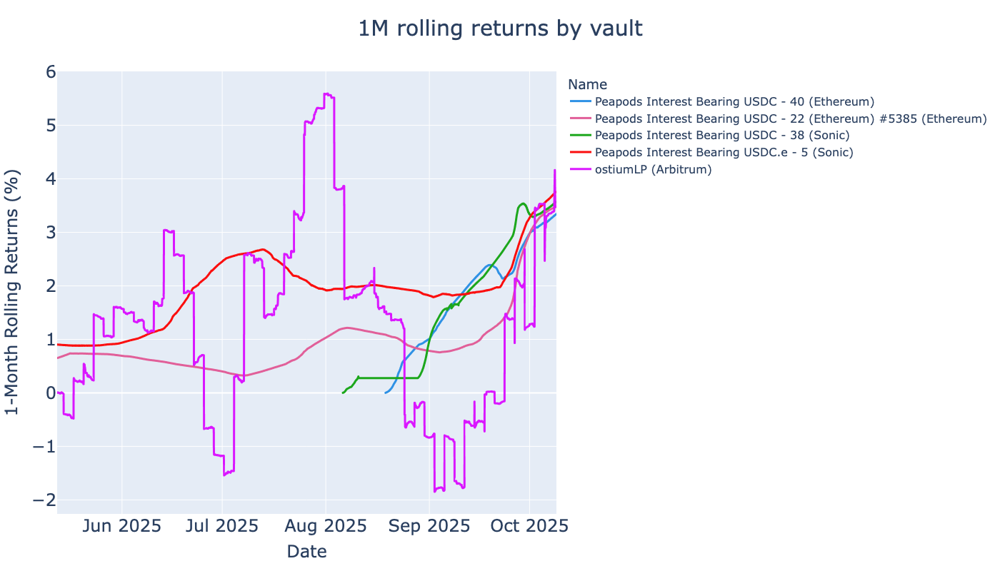

,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC.e - 5,13.94%,26.61%,7.75%,35.84%,138.9,3.75%,59.03%,0.0001,USDC,Sonic,"148,662.53","78,104.23",0.55,unknown,unknown,"3,819",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC - 38,5.53%,36.61%,5.53%,36.61%,74.8,3.57%,55.50%,0.0002,USDC,Sonic,"142,910.19","119,899.88",0.17,unknown,unknown,491,Peapods,146-0x87caed1e19da46098e710b69cae33e74c146bacd,2025-09-09 01:32:39,2025-10-09 00:03:16
ostiumLP,14.09%,10.98%,3.60%,15.62%,2.0,3.48%,53.90%,0.0045,USDC,Arbitrum,"68,095,256.35","29,030,245.33",1.26,unknown,unknown,"15,781",Ostium,42161-0x20d419a8e12c45f88fda7c5760bb6923cee27f98,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 22,7.27%,15.59%,5.56%,24.87%,86.6,3.48%,53.78%,0.0002,USDC,Ethereum,"156,630.95","108,517.99",0.48,unknown,unknown,"2,314",Peapods,1-0x8f135bcfc4084ce6c8620e87b12c4ee82d165276,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47


In [9]:
import plotly.express as px
from plotly.colors import qualitative

from eth_defi.research.rolling_returns import calculate_rolling_returns
from eth_defi.research.rolling_returns import visualise_rolling_returns

benchmark_count: int = 5
nav_threshold: float = 50_000
event_threshold: int = 25

returns_df = prices_df

lifetime_data_filtered_df = lifetime_data_df[(lifetime_data_df["current_nav"] >= nav_threshold) & (lifetime_data_df["event_count"] >= event_threshold)]
lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="one_month_cagr", ascending=False)

interesting_vaults = lifetime_data_filtered_df[0:benchmark_count]["id"]

df = rolling_returns_df = all_rolling_returns_df = calculate_rolling_returns(
    returns_df,
    interesting_vaults=interesting_vaults,
    clip_up=700,
)

# Report manual fee data gathering needed
lack_fees_df = df[df["performance_fee"].isna()]
print(f"We lack perf fee data for {len(lack_fees_df['id'].unique()):,} / {len(interesting_vaults)} vaults")

# display(df.head(2))

fig = visualise_rolling_returns(df)

fig.show()

display(format_lifetime_table(lifetime_data_filtered_df.head(benchmark_count)))

### Non-volatile vaults only

- Exclude gDAI to see other vaults better in the chart



Showing 1m rolling returns for stable vaults with volatility 0.02% or less


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC.e - 5,13.94%,26.61%,7.75%,35.84%,138.9,3.75%,59.03%,0.0001,USDC,Sonic,"148,662.53","78,104.23",0.55,unknown,unknown,"3,819",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC - 33,7.55%,31.53%,7.07%,32.38%,248.5,2.81%,41.81%,0.0001,USDC,Ethereum,"19,505,023.19","14,713,797.70",0.27,unknown,unknown,"1,618",Peapods,1-0x14794665d2f467a6e393e1a7210c49a1aa571d77,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 24,17.34%,44.07%,6.57%,29.83%,280.6,2.63%,38.73%,0.0001,USDC,Ethereum,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 6,21.05%,33.26%,6.16%,27.78%,206.2,2.69%,39.66%,0.0001,USDC,Arbitrum,"4,599,069.91","3,050,925.84",0.67,unknown,unknown,"8,538",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 67,13.97%,27.59%,6.11%,27.56%,285.1,2.54%,37.07%,0.0000,USDC,Base,"203,067.01","155,456.30",0.54,unknown,unknown,"5,928",Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,2025-09-09 01:02:57,2025-10-09 00:02:57


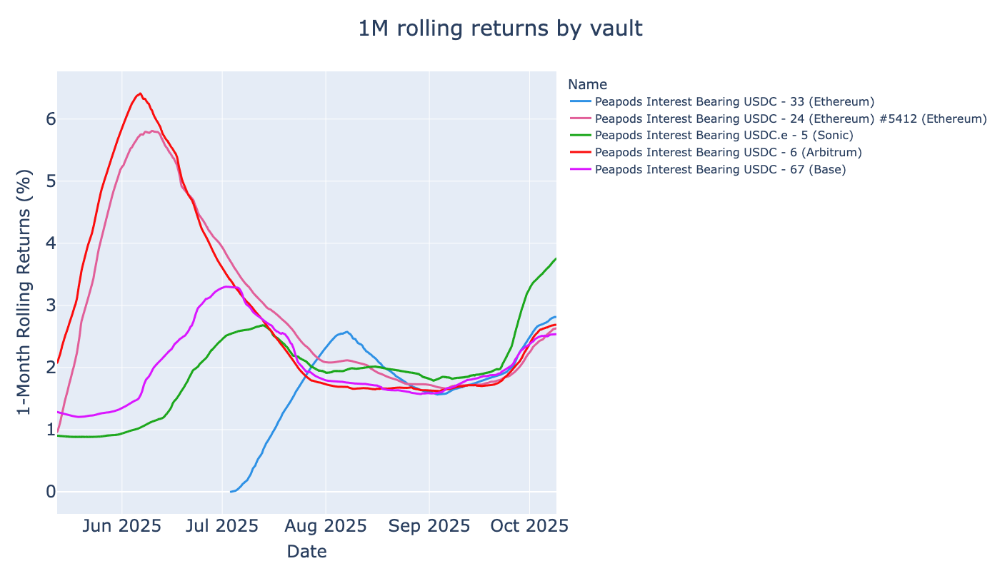

In [10]:
# TODO: Fix with better filtering
volatility_threshold = 0.0002

# lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["three_months_volatility"] < volatility_threshold]
# lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_returns", ascending=False)

stable_vaults = lifetime_data_filtered_df[lifetime_data_filtered_df["three_months_volatility"] < volatility_threshold]
stable_vaults = stable_vaults.sort_values(by="three_months_returns", ascending=False)
stable_vaults = stable_vaults.head(5)
# display(format_lifetime_table(stable_vaults))
stable_vault_ids = stable_vaults["id"].unique()

print(f"Showing 1m rolling returns for stable vaults with volatility {volatility_threshold:.2%} or less")
display(format_lifetime_table(stable_vaults))

# display(all_rolling_returns_df.head(5))

# print("We got", all_rolling_returns_df["id"].unique())

non_volatile_df = calculate_rolling_returns(
    returns_df,
    interesting_vaults=stable_vault_ids,
    clip_up=70,
)
# display(non_volatile_df.head(5))

fig = visualise_rolling_returns(non_volatile_df)
fig.show()

### All vaults, volatile only

- Benchmark market-making and such vaults against each other across chains.

Top volatile vaults


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Supply USDC on ZeroLend RWA Market,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,Ethereum,"804,731.19","30,119.23",0.83,unknown,unknown,116,<unknown ERC-4626>,1-0x887d57a509070a0843c6418eb5cffc090dcbbe95,2025-09-09 01:17:47,2025-10-09 00:47:47
Static RWA ZeroLend USDC,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,Ethereum,"804,766.49","35,758.86",0.83,unknown,unknown,133,Superform,1-0x942bed98560e9b2aa0d4ec76bbda7a7e55f6b2d6,2025-09-09 01:17:47,2025-10-09 00:47:47
Sturdy crvUSD Compounder,18.44%,14.21%,1.82%,51.10%,110.4,0.00%,0.00%,0.0002,crvUSD,Ethereum,"1,418,140.04","39,501.79",1.27,unknown,unknown,326,<unknown ERC-4626>,1-0x05329aab081b125eef7fbbc8b857428d478e692b,2025-07-11 01:16:35,2025-07-27 07:31:11
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
DeltaUSD HyperLiquid USDN Funding Arb,2.28%,40.96%,2.28%,40.96%,8.3,2.28%,40.96%,0.0025,USDT,Ethereum,"381,479.42","351,843.38",0.07,unknown,unknown,36,Lagoon,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 20:06:23,2025-10-09 00:47:47
USDC-TYBG shares,2.26%,40.41%,2.26%,40.41%,7.8,2.26%,40.41%,0.0027,USDC,Base,"30,406.59","25,425.09",0.07,unknown,unknown,31,<unknown ERC-4626>,8453-0xa653f93fc9dfe6d6cbc2abd04227a3d9999af69a,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 137,2.23%,39.86%,2.23%,39.86%,68.5,2.23%,39.86%,0.0003,USDC,Base,"114,704.73","68,279.21",0.07,unknown,unknown,372,Peapods,8453-0xf62e2a8ffc2cb285e33b552dc893c948d47d09d5,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 38,5.53%,36.61%,5.53%,36.61%,74.8,3.57%,55.50%,0.0002,USDC,Sonic,"142,910.19","119,899.88",0.17,unknown,unknown,491,Peapods,146-0x87caed1e19da46098e710b69cae33e74c146bacd,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 5,13.94%,26.61%,7.75%,35.84%,138.9,3.75%,59.03%,0.0001,USDC,Sonic,"148,662.53","78,104.23",0.55,unknown,unknown,"3,819",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,2025-09-09 01:32:39,2025-10-09 00:03:16


Sample data


,id,timestamp,chain,address,block_number,share_price,total_assets,total_supply,performance_fee,management_fee,errors,name,event_count,protocol,raw_share_price,pct_change_prev,pct_change_next,returns_1h,avg_assets_by_vault,dynamic_tvl_threshold,tvl_filtering_mask,rolling_1m_returns
0,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 20:06:23,1,0x01f461a0bbb218bc1943aa027c5bbc424391e541,23363599,1.01,"111,360.57","109,774.32",NaN,NaN,,DeltaUSD HyperLiquid USDN Funding Arb (Ethereum),36,Lagoon,1.01,NaN,0.00,NaN,"263,896.38","5,277.93",False,0.00
1,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 21:06:35,1,0x01f461a0bbb218bc1943aa027c5bbc424391e541,23363899,1.01,"111,360.57","109,774.32",NaN,NaN,,DeltaUSD HyperLiquid USDN Funding Arb (Ethereum),36,Lagoon,1.01,0.00,0.00,0.00,"263,896.38","5,277.93",False,0.00
2,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 22:06:47,1,0x01f461a0bbb218bc1943aa027c5bbc424391e541,23364199,1.01,"111,360.57","109,774.32",NaN,NaN,,DeltaUSD HyperLiquid USDN Funding Arb (Ethereum),36,Lagoon,1.01,0.00,0.00,0.00,"263,896.38","5,277.93",False,0.00
3,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 23:07:11,1,0x01f461a0bbb218bc1943aa027c5bbc424391e541,23364499,1.01,"111,360.57","109,774.32",NaN,NaN,,DeltaUSD HyperLiquid USDN Funding Arb (Ethereum),36,Lagoon,1.01,0.00,0.00,0.00,"263,896.38","5,277.93",False,0.00
4,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-15 00:07:23,1,0x01f461a0bbb218bc1943aa027c5bbc424391e541,23364799,1.01,"111,360.57","109,774.32",NaN,NaN,,DeltaUSD HyperLiquid USDN Funding Arb (Ethereum),36,Lagoon,1.01,0.00,0.00,0.00,"263,896.38","5,277.93",False,0.00


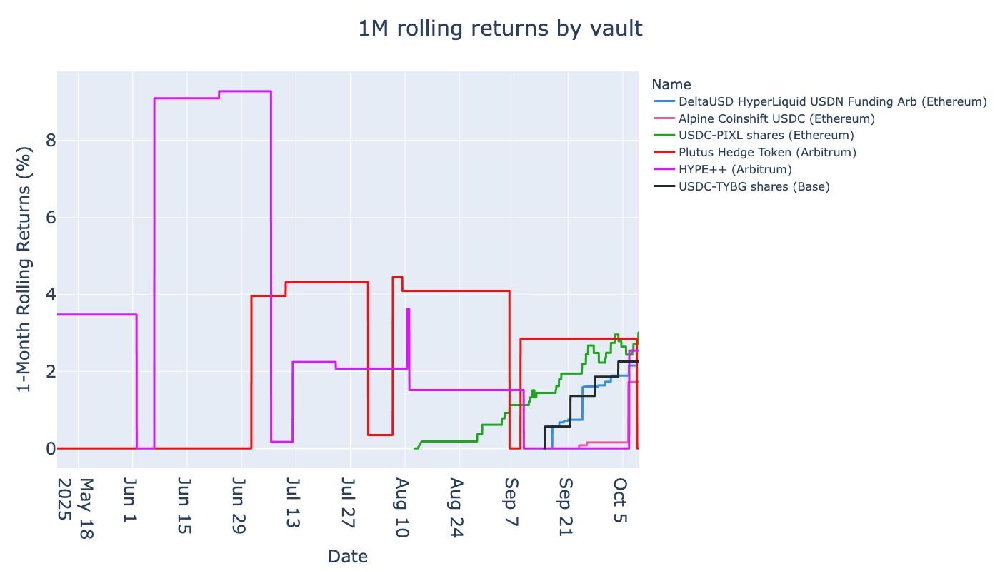

In [11]:
volatility_threshold = 0.001
benchmark_count = 20
nav_threshold = 25_000
lifetime_data_filtered_df = lifetime_data_df[(lifetime_data_df["current_nav"] >= nav_threshold) & (lifetime_data_df["event_count"] >= event_threshold)]

lifetime_data_filtered_df = lifetime_data_df
lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["current_nav"] > nav_threshold]
lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_cagr", ascending=False)

lifetime_data_filtered_df = lifetime_data_filtered_df.iloc[0:benchmark_count]
interesting_vaults = lifetime_data_filtered_df[lifetime_data_filtered_df["three_months_volatility"] > volatility_threshold]

interesting_vaults = interesting_vaults.iloc[0:benchmark_count]

rolling_returns_df = calculate_rolling_returns(
    returns_df,
    interesting_vaults=set(interesting_vaults["id"]),
    clip_down=-20,
    clip_up=50,
)

print("Top volatile vaults")
display(format_lifetime_table(lifetime_data_filtered_df))

print("Sample data")
display(rolling_returns_df.head(5))

fig = visualise_rolling_returns(rolling_returns_df)
fig.show()

### All vaults, volatile only, filtering extreme results

- Better representative of volatile vaults with more NAV filering
- Remove vaults with seemingly bad returns
- TODO: This seems be very difficult to analyse

Total 14 interesting volatile vaults: [41, 1699, 350, 385, 722, 536, 1512, 2346, 310, 2299, 743, 2470, 1781, 1301]
Top 20 volatile vaults by the lat returns 


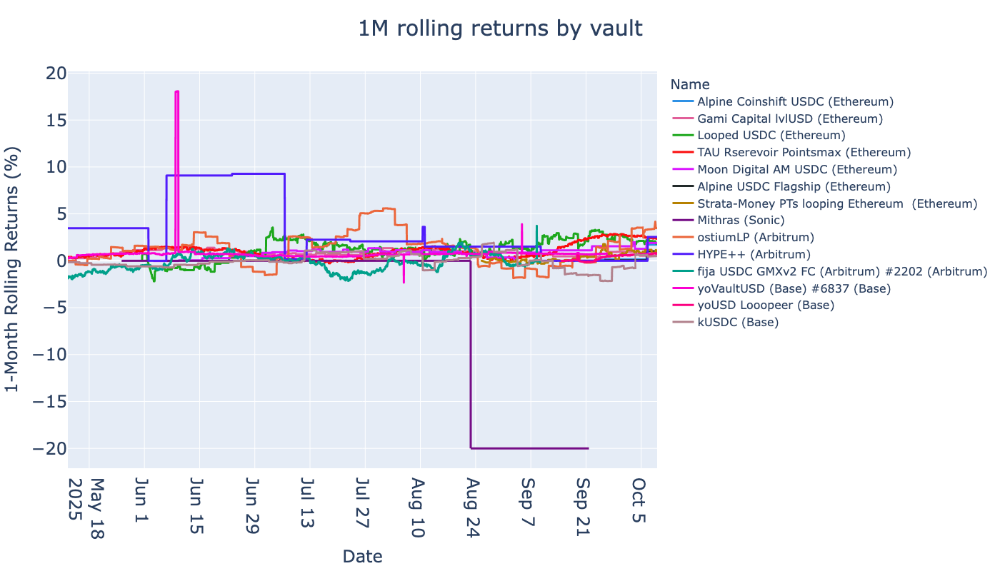

In [12]:
bad_returns_threshold = 900
benchmark_count = 15  # By the last 1-month returns
nav_threshold = 500_000

lifetime_data_filtered_df = lifetime_data_df
lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["current_nav"] > nav_threshold]
lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_cagr", ascending=False)

# lifetime_data_filtered_df = lifetime_data_filtered_df.iloc[0:benchmark_count]
interesting_vaults = lifetime_data_filtered_df[lifetime_data_filtered_df["three_months_volatility"] > volatility_threshold]

# display(interesting_vaults)

print(f"Total {len(interesting_vaults)} interesting volatile vaults: {interesting_vaults.index.tolist()}")

interesting_vaults = interesting_vaults.iloc[0:benchmark_count]

rolling_returns_df = calculate_rolling_returns(
    returns_df,
    interesting_vaults=interesting_vaults["id"],
    clip_down=-20,
    clip_up=50,
)

print("Top 20 volatile vaults by the lat returns ")
fig = visualise_rolling_returns(rolling_returns_df)
fig.show()

### Historical performance, including dead ones

- Sorted by lifetime returns, the current three month returns displayed as well
- Vaults may be dead today with zero NAV/TVL
- Reasons why NAV drops to zero may include: hacks, rug pulls, etc.
- Share price calculation for low TVL vaults may have various inaccuracies because vaults implement vesting/locking mechanisms which are not visible in the share price

In [13]:
from eth_defi.research.vault_metrics import format_lifetime_table


nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df["peak_nav"] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="cagr", ascending=False)
display(format_lifetime_table(lifetime_data_filtered_df.head(20)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 1,056 out of 1250 total vaults
Vaults with negative returns 194 out of 1250 total vaults


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Coinflakes Investment Vault,100.00%,49.27%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,DAI,Ethereum,"882,877.00",0.00,1.73,unknown,unknown,44,<unknown ERC-4626>,1-0x430fd367dbbaebdae682060e0fd2b2b1583e0639,2022-12-11 09:33:59,2024-09-03 17:59:23
Aave V3 USDC Lender,3.04%,45.77%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDC,Ethereum,"308,202.30","308,202.30",0.08,unknown,unknown,200,<unknown ERC-4626>,1-0xbdb97ec319c41c6fa383e94ece6bdf383dfc7be4,2024-03-18 20:58:35,2024-04-17 02:06:35
HYPE++,39.39%,45.75%,6.24%,28.22%,3.5,2.54%,37.10%,0.0043,USDC,Arbitrum,"6,241,538.82","3,541,406.72",0.88,unknown,unknown,224,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,2025-09-09 01:10:25,2025-10-09 00:24:39
Morpho Gauntlet DAI Core Compounder,7.06%,45.05%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,DAI,Ethereum,"1,057,504.23","8,490.18",0.18,unknown,unknown,191,<unknown ERC-4626>,1-0x09580f2305a335218bdb2eb828387d52ed8fc2f4,2024-12-17 10:36:35,2025-02-23 03:59:59
StrategyGearboxLenderUSDC,70.91%,44.68%,0.87%,3.66%,nan,0.31%,4.09%,0.0000,USDC,Ethereum,"118,841.97",199.67,1.45,unknown,unknown,46,<unknown ERC-4626>,1-0xf6e2d36c489e5b361cdc962d4568cea663ad5ddc,2025-09-10 00:23:47,2025-10-08 08:39:23
Degen Pool USDC,28.29%,44.54%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDC,Arbitrum,"368,571.03","6,573.08",0.68,unknown,unknown,172,<unknown ERC-4626>,42161-0x20a1012b79e8f3ca3f802533c07934ef97398da7,2023-05-22 18:58:35,2024-01-25 08:55:49
Peapods Interest Bearing USDC - 24,17.34%,44.07%,6.57%,29.83%,280.6,2.63%,38.73%,0.0001,USDC,Ethereum,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
FARM_USDT,36.08%,42.30%,4.77%,21.35%,5.1,0.00%,0.00%,0.0043,USDT,Ethereum,"27,994.66","3,893.02",0.87,unknown,unknown,76,Harvest Finance,1-0x8c809fe169a9c003fd50f2ee350d6a9a1d0bdab8,2025-09-10 00:23:47,2025-10-08 08:39:23


### Historical performance, vaults still alive

- Sorted by lifetime returns
- Vaults have still meaningful TVL today


In [14]:
nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df["current_nav"] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="cagr", ascending=False)
display(format_lifetime_table(lifetime_data_filtered_df.head(20)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 742 out of 854 total vaults
Vaults with negative returns 112 out of 854 total vaults


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Aave V3 USDC Lender,3.04%,45.77%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDC,Ethereum,"308,202.30","308,202.30",0.08,unknown,unknown,200,<unknown ERC-4626>,1-0xbdb97ec319c41c6fa383e94ece6bdf383dfc7be4,2024-03-18 20:58:35,2024-04-17 02:06:35
HYPE++,39.39%,45.75%,6.24%,28.22%,3.5,2.54%,37.10%,0.0043,USDC,Arbitrum,"6,241,538.82","3,541,406.72",0.88,unknown,unknown,224,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 24,17.34%,44.07%,6.57%,29.83%,280.6,2.63%,38.73%,0.0001,USDC,Ethereum,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
DeltaUSD HyperLiquid USDN Funding Arb,2.28%,40.96%,2.28%,40.96%,8.3,2.28%,40.96%,0.0025,USDT,Ethereum,"381,479.42","351,843.38",0.07,unknown,unknown,36,Lagoon,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 20:06:23,2025-10-09 00:47:47
cSuperior Quality Private Credit USDC,39.84%,40.93%,5.08%,22.56%,19.6,1.68%,23.28%,0.0006,USDC,Ethereum,"502,417.30","433,568.75",0.98,unknown,unknown,135,<unknown ERC-4626>,1-0x438982ea288763370946625fd76c2508ee1fb229,2025-09-09 01:17:47,2025-10-09 00:47:47
USDC-TYBG shares,2.26%,40.41%,2.26%,40.41%,7.8,2.26%,40.41%,0.0027,USDC,Base,"30,406.59","25,425.09",0.07,unknown,unknown,31,<unknown ERC-4626>,8453-0xa653f93fc9dfe6d6cbc2abd04227a3d9999af69a,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 137,2.23%,39.86%,2.23%,39.86%,68.5,2.23%,39.86%,0.0003,USDC,Base,"114,704.73","68,279.21",0.07,unknown,unknown,372,Peapods,8453-0xf62e2a8ffc2cb285e33b552dc893c948d47d09d5,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 16,23.01%,38.55%,3.22%,13.87%,15.5,0.00%,0.00%,0.0005,USDC,Ethereum,"361,670.80","271,555.77",0.64,unknown,unknown,220,Peapods,1-0xca1154bbd62c21868a358f9f782b90d69af600b0,2025-09-09 01:17:47,2025-10-09 00:47:47


### 3M returns, including low-activity ones

- Sorted by three months CAGR
- Include low-activity ones

In [15]:
nav_threshold = 25_000

lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df["current_nav"] >= nav_threshold]

positive_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] > 0]
negative_returns_df = lifetime_data_filtered_df[lifetime_data_filtered_df["lifetime_return"] <= 0]

print(f"All vaults sorted by lifetime returns and having currnet NAV > ${nav_threshold:,} USD")
print(f"Vaults with positive returns {len(positive_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")
print(f"Vaults with negative returns {len(negative_returns_df):,} out of {len(lifetime_data_filtered_df)} total vaults")

lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_cagr", ascending=False)

display(format_lifetime_table(lifetime_data_filtered_df.head(20)))

All vaults sorted by lifetime returns and having currnet NAV > $25,000 USD
Vaults with positive returns 742 out of 854 total vaults
Vaults with negative returns 112 out of 854 total vaults


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Chain,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,,
Supply USDC on ZeroLend RWA Market,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,Ethereum,"804,731.19","30,119.23",0.83,unknown,unknown,116,<unknown ERC-4626>,1-0x887d57a509070a0843c6418eb5cffc090dcbbe95,2025-09-09 01:17:47,2025-10-09 00:47:47
Static RWA ZeroLend USDC,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,Ethereum,"804,766.49","35,758.86",0.83,unknown,unknown,133,Superform,1-0x942bed98560e9b2aa0d4ec76bbda7a7e55f6b2d6,2025-09-09 01:17:47,2025-10-09 00:47:47
Sturdy crvUSD Compounder,18.44%,14.21%,1.82%,51.10%,110.4,0.00%,0.00%,0.0002,crvUSD,Ethereum,"1,418,140.04","39,501.79",1.27,unknown,unknown,326,<unknown ERC-4626>,1-0x05329aab081b125eef7fbbc8b857428d478e692b,2025-07-11 01:16:35,2025-07-27 07:31:11
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,Ethereum,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
DeltaUSD HyperLiquid USDN Funding Arb,2.28%,40.96%,2.28%,40.96%,8.3,2.28%,40.96%,0.0025,USDT,Ethereum,"381,479.42","351,843.38",0.07,unknown,unknown,36,Lagoon,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 20:06:23,2025-10-09 00:47:47
USDC-TYBG shares,2.26%,40.41%,2.26%,40.41%,7.8,2.26%,40.41%,0.0027,USDC,Base,"30,406.59","25,425.09",0.07,unknown,unknown,31,<unknown ERC-4626>,8453-0xa653f93fc9dfe6d6cbc2abd04227a3d9999af69a,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 137,2.23%,39.86%,2.23%,39.86%,68.5,2.23%,39.86%,0.0003,USDC,Base,"114,704.73","68,279.21",0.07,unknown,unknown,372,Peapods,8453-0xf62e2a8ffc2cb285e33b552dc893c948d47d09d5,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 38,5.53%,36.61%,5.53%,36.61%,74.8,3.57%,55.50%,0.0002,USDC,Sonic,"142,910.19","119,899.88",0.17,unknown,unknown,491,Peapods,146-0x87caed1e19da46098e710b69cae33e74c146bacd,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 5,13.94%,26.61%,7.75%,35.84%,138.9,3.75%,59.03%,0.0001,USDC,Sonic,"148,662.53","78,104.23",0.55,unknown,unknown,"3,819",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,2025-09-09 01:32:39,2025-10-09 00:03:16


## Top vaults by chain

- Show 1 month rolling returns of top vaults for all chains chain


Doing chain breakdown for chains: ['Ethereum', 'Plasma', 'Base', 'Binance', 'Arbitrum', 'Avalanche', 'Linea', 'Gnosis', 'Hemi', 'Optimism', 'Polygon', 'Hyperliquid', 'Berachain', 'Sonic', 'Blast', 'Soneium', 'ZKsync', 'Mode', 'Mantle']


### Ethereum

Ethereum: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Supply USDC on ZeroLend RWA Market,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,"804,731.19","30,119.23",0.83,unknown,unknown,116,<unknown ERC-4626>,1-0x887d57a509070a0843c6418eb5cffc090dcbbe95,2025-09-09 01:17:47,2025-10-09 00:47:47
Static RWA ZeroLend USDC,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,"804,766.49","35,758.86",0.83,unknown,unknown,133,Superform,1-0x942bed98560e9b2aa0d4ec76bbda7a7e55f6b2d6,2025-09-09 01:17:47,2025-10-09 00:47:47
Sturdy crvUSD Compounder,18.44%,14.21%,1.82%,51.10%,110.4,0.00%,0.00%,0.0002,crvUSD,"1,418,140.04","39,501.79",1.27,unknown,unknown,326,<unknown ERC-4626>,1-0x05329aab081b125eef7fbbc8b857428d478e692b,2025-07-11 01:16:35,2025-07-27 07:31:11
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
DeltaUSD HyperLiquid USDN Funding Arb,2.28%,40.96%,2.28%,40.96%,8.3,2.28%,40.96%,0.0025,USDT,"381,479.42","351,843.38",0.07,unknown,unknown,36,Lagoon,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 20:06:23,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 33,7.55%,31.53%,7.07%,32.38%,248.5,2.81%,41.81%,0.0001,USDC,"19,505,023.19","14,713,797.70",0.27,unknown,unknown,"1,618",Peapods,1-0x14794665d2f467a6e393e1a7210c49a1aa571d77,2025-09-09 01:17:47,2025-10-09 00:47:47
USDC-PIXL shares,4.16%,29.87%,4.16%,29.87%,12.3,3.00%,45.18%,0.0013,USDC,"136,238.74","95,096.00",0.16,unknown,unknown,25,<unknown ERC-4626>,1-0xf55cd3c172427880dee1b24a91f33a1ca2cf3c8f,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 24,17.34%,44.07%,6.57%,29.83%,280.6,2.63%,38.73%,0.0001,USDC,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
Alpine Coinshift USDC,1.72%,29.67%,1.72%,29.67%,4.3,1.72%,29.67%,0.0036,USDC,"742,262.58","742,262.58",0.07,unknown,unknown,65,<unknown ERC-4626>,1-0x0985c88929a776a2e059615137a48ba5a473e25d,2025-09-14 20:06:23,2025-10-09 00:47:47


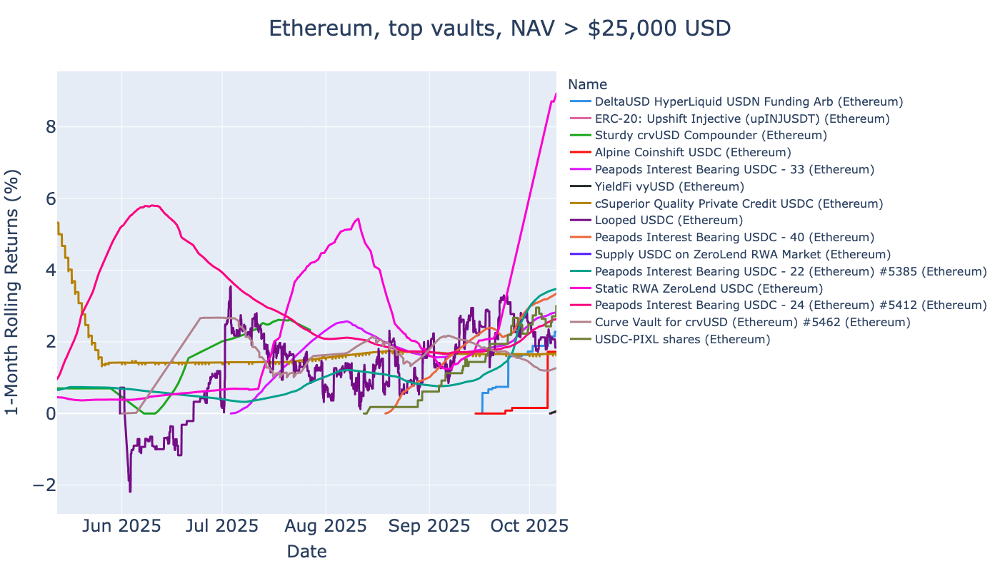

Ethereum: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Supply USDC on ZeroLend RWA Market,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,"804,731.19","30,119.23",0.83,unknown,unknown,116,<unknown ERC-4626>,1-0x887d57a509070a0843c6418eb5cffc090dcbbe95,2025-09-09 01:17:47,2025-10-09 00:47:47
Static RWA ZeroLend USDC,22.96%,28.40%,16.39%,86.43%,97.6,8.93%,193.77%,0.0004,USDC,"804,766.49","35,758.86",0.83,unknown,unknown,133,Superform,1-0x942bed98560e9b2aa0d4ec76bbda7a7e55f6b2d6,2025-09-09 01:17:47,2025-10-09 00:47:47
Sturdy crvUSD Compounder,18.44%,14.21%,1.82%,51.10%,110.4,0.00%,0.00%,0.0002,crvUSD,"1,418,140.04","39,501.79",1.27,unknown,unknown,326,<unknown ERC-4626>,1-0x05329aab081b125eef7fbbc8b857428d478e692b,2025-07-11 01:16:35,2025-07-27 07:31:11
Peapods Interest Bearing USDC - 40,5.14%,43.18%,5.14%,43.18%,141.1,3.34%,51.31%,0.0001,USDC,"15,652,944.84","15,652,944.84",0.14,unknown,unknown,"6,064",Peapods,1-0x6f742b302de01afca0d09ae880d9f842f73dbc05,2025-09-09 01:17:47,2025-10-09 00:47:47
DeltaUSD HyperLiquid USDN Funding Arb,2.28%,40.96%,2.28%,40.96%,8.3,2.28%,40.96%,0.0025,USDT,"381,479.42","351,843.38",0.07,unknown,unknown,36,Lagoon,1-0x01f461a0bbb218bc1943aa027c5bbc424391e541,2025-09-14 20:06:23,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 33,7.55%,31.53%,7.07%,32.38%,248.5,2.81%,41.81%,0.0001,USDC,"19,505,023.19","14,713,797.70",0.27,unknown,unknown,"1,618",Peapods,1-0x14794665d2f467a6e393e1a7210c49a1aa571d77,2025-09-09 01:17:47,2025-10-09 00:47:47
USDC-PIXL shares,4.16%,29.87%,4.16%,29.87%,12.3,3.00%,45.18%,0.0013,USDC,"136,238.74","95,096.00",0.16,unknown,unknown,25,<unknown ERC-4626>,1-0xf55cd3c172427880dee1b24a91f33a1ca2cf3c8f,2025-09-09 01:17:47,2025-10-09 00:47:47
Peapods Interest Bearing USDC - 24,17.34%,44.07%,6.57%,29.83%,280.6,2.63%,38.73%,0.0001,USDC,"13,302,081.11","13,182,961.57",0.44,unknown,unknown,"2,954",Peapods,1-0xc441d0bd70dbcf711f4bba19aea3deff47ce1c48,2025-09-09 01:17:47,2025-10-09 00:47:47
Alpine Coinshift USDC,1.72%,29.67%,1.72%,29.67%,4.3,1.72%,29.67%,0.0036,USDC,"742,262.58","742,262.58",0.07,unknown,unknown,65,<unknown ERC-4626>,1-0x0985c88929a776a2e059615137a48ba5a473e25d,2025-09-14 20:06:23,2025-10-09 00:47:47


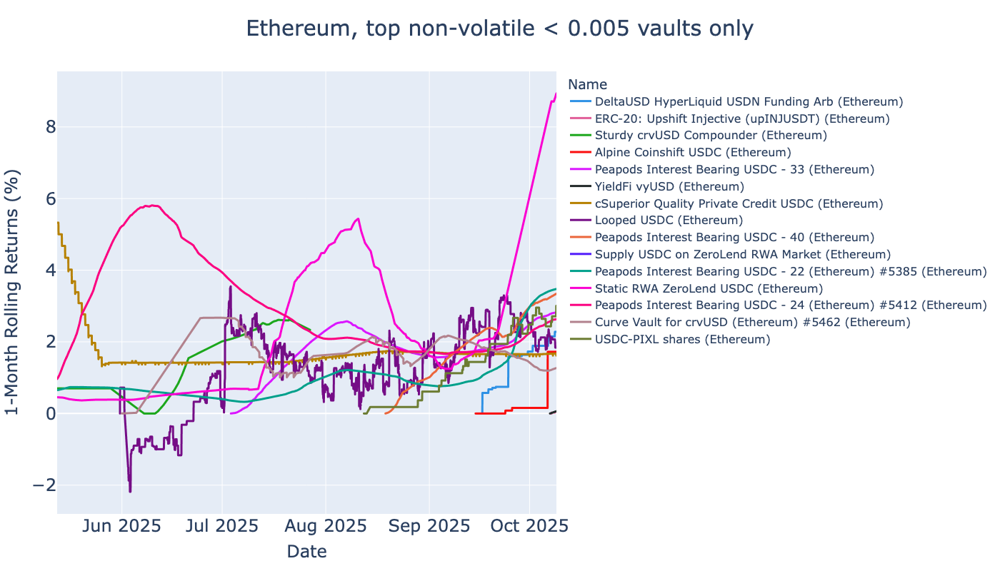

### Plasma

Plasma: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USD.ai USDai,0.71%,21.88%,0.71%,21.88%,155.8,0.71%,21.88%,0.0001,USDai,"128,676,357.96","62,692,177.43",0.04,unknown,unknown,"2,688",Euler Vault Kit,9745-0xaadea03f6d6f198bdc9229bd8113aced19031773,2025-09-25 17:38:42,2025-10-09 00:40:34
K3 USDT0,0.64%,19.47%,0.64%,19.47%,55.1,0.64%,19.47%,0.0002,USDT0,"19,485,193.90","12,389,133.48",0.04,unknown,unknown,192,Term Finance,9745-0x539b2ee4f3a04f33d53c0813f77e65148963f72b,2025-09-25 20:38:42,2025-10-09 00:40:34
AUTOfinance plasmaUSD,0.46%,9.12%,0.46%,9.12%,49.9,0.46%,9.12%,0.0001,USDT0,"7,666,216.82","7,666,216.82",0.05,unknown,unknown,203,<unknown ERC-4626>,9745-0x4ec8f8b0f144ce1fa280b84f01df9e353e83ec80,2025-09-19 21:35:05,2025-10-09 00:40:34
TelosC Stream USDT0,0.31%,8.29%,0.31%,8.29%,292.2,0.31%,8.29%,0.0000,USDT0,"115,007,507.28","115,003,564.70",0.04,unknown,unknown,828,Euler Vault Kit,9745-0x57c582346b7d49a46af3745a8278917d1c1311b8,2025-09-24 20:38:42,2025-10-09 00:40:34
Hyperithm Euler USDT,0.11%,6.68%,0.11%,6.68%,268.2,0.11%,6.68%,0.0000,USDT0,"36,043,983.35","33,079,132.42",0.02,unknown,unknown,953,<unknown ERC-4626>,9745-0x66be42a0bda425a8c3b3c2cf4f4cb9edfcaed21d,2025-10-02 04:40:27,2025-10-09 00:40:34
TelosC Earn USDT0,0.22%,5.90%,0.22%,5.90%,215.1,0.22%,5.90%,0.0000,USDT0,"335,618,491.20","334,827,917.01",0.04,unknown,unknown,"4,141",<unknown ERC-4626>,9745-0xa9c251f8304b1b3fc2b9e8fcae78d94eff82ac66,2025-09-24 20:38:42,2025-10-09 00:40:34
Resolv RLP USDT0,0.19%,5.48%,0.19%,5.48%,120.0,0.19%,5.48%,0.0000,USDT0,"35,471,300.54","35,383,788.83",0.04,unknown,unknown,"1,146",Euler Vault Kit,9745-0x538f01e0ba3cf3ab5b3837a0d138a3f67b9b8235,2025-09-25 12:38:42,2025-10-09 00:40:34
Re7 Labs xUSD USDT0,0.04%,5.09%,0.04%,5.09%,131.3,0.04%,5.09%,0.0000,USDT0,"57,875,142.65","27,115,366.94",0.01,unknown,unknown,74,Euler Vault Kit,9745-0xf675fbe777e992f5d5d84adf41161dc0f20104a6,2025-10-05 14:40:27,2025-10-09 00:40:34
Frontier PT-syrupUSDT syrupUSDT,0.05%,4.04%,0.05%,4.04%,294.3,0.05%,4.04%,0.0000,USDT0,"19,658,925.78","19,658,925.78",0.01,unknown,unknown,71,Euler Vault Kit,9745-0xf0a1bdf7e678144702fec359fa1a0eb50b0b8845,2025-10-03 12:40:27,2025-10-09 00:40:34


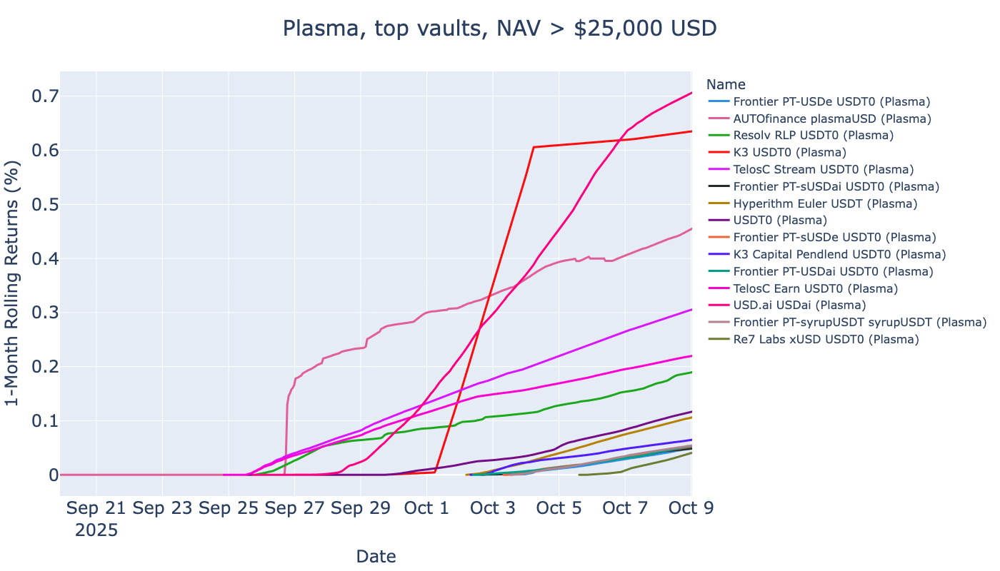

Plasma: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USD.ai USDai,0.71%,21.88%,0.71%,21.88%,155.8,0.71%,21.88%,0.0001,USDai,"128,676,357.96","62,692,177.43",0.04,unknown,unknown,"2,688",Euler Vault Kit,9745-0xaadea03f6d6f198bdc9229bd8113aced19031773,2025-09-25 17:38:42,2025-10-09 00:40:34
K3 USDT0,0.64%,19.47%,0.64%,19.47%,55.1,0.64%,19.47%,0.0002,USDT0,"19,485,193.90","12,389,133.48",0.04,unknown,unknown,192,Term Finance,9745-0x539b2ee4f3a04f33d53c0813f77e65148963f72b,2025-09-25 20:38:42,2025-10-09 00:40:34
AUTOfinance plasmaUSD,0.46%,9.12%,0.46%,9.12%,49.9,0.46%,9.12%,0.0001,USDT0,"7,666,216.82","7,666,216.82",0.05,unknown,unknown,203,<unknown ERC-4626>,9745-0x4ec8f8b0f144ce1fa280b84f01df9e353e83ec80,2025-09-19 21:35:05,2025-10-09 00:40:34
TelosC Stream USDT0,0.31%,8.29%,0.31%,8.29%,292.2,0.31%,8.29%,0.0000,USDT0,"115,007,507.28","115,003,564.70",0.04,unknown,unknown,828,Euler Vault Kit,9745-0x57c582346b7d49a46af3745a8278917d1c1311b8,2025-09-24 20:38:42,2025-10-09 00:40:34
Hyperithm Euler USDT,0.11%,6.68%,0.11%,6.68%,268.2,0.11%,6.68%,0.0000,USDT0,"36,043,983.35","33,079,132.42",0.02,unknown,unknown,953,<unknown ERC-4626>,9745-0x66be42a0bda425a8c3b3c2cf4f4cb9edfcaed21d,2025-10-02 04:40:27,2025-10-09 00:40:34
TelosC Earn USDT0,0.22%,5.90%,0.22%,5.90%,215.1,0.22%,5.90%,0.0000,USDT0,"335,618,491.20","334,827,917.01",0.04,unknown,unknown,"4,141",<unknown ERC-4626>,9745-0xa9c251f8304b1b3fc2b9e8fcae78d94eff82ac66,2025-09-24 20:38:42,2025-10-09 00:40:34
Resolv RLP USDT0,0.19%,5.48%,0.19%,5.48%,120.0,0.19%,5.48%,0.0000,USDT0,"35,471,300.54","35,383,788.83",0.04,unknown,unknown,"1,146",Euler Vault Kit,9745-0x538f01e0ba3cf3ab5b3837a0d138a3f67b9b8235,2025-09-25 12:38:42,2025-10-09 00:40:34
Re7 Labs xUSD USDT0,0.04%,5.09%,0.04%,5.09%,131.3,0.04%,5.09%,0.0000,USDT0,"57,875,142.65","27,115,366.94",0.01,unknown,unknown,74,Euler Vault Kit,9745-0xf675fbe777e992f5d5d84adf41161dc0f20104a6,2025-10-05 14:40:27,2025-10-09 00:40:34
Frontier PT-syrupUSDT syrupUSDT,0.05%,4.04%,0.05%,4.04%,294.3,0.05%,4.04%,0.0000,USDT0,"19,658,925.78","19,658,925.78",0.01,unknown,unknown,71,Euler Vault Kit,9745-0xf0a1bdf7e678144702fec359fa1a0eb50b0b8845,2025-10-03 12:40:27,2025-10-09 00:40:34


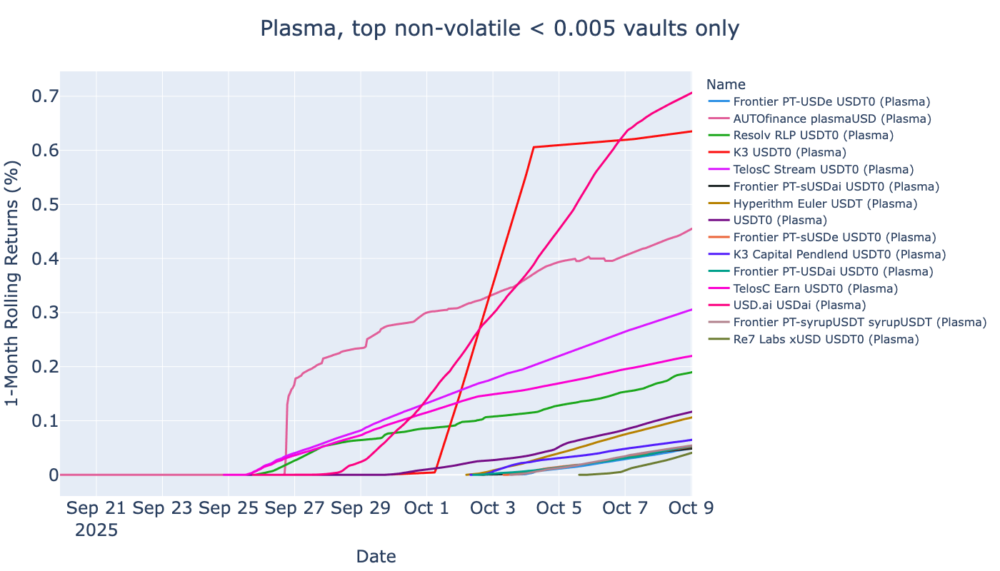

### Base

Base: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USDC-TYBG shares,2.26%,40.41%,2.26%,40.41%,7.8,2.26%,40.41%,0.0027,USDC,"30,406.59","25,425.09",0.07,unknown,unknown,31,<unknown ERC-4626>,8453-0xa653f93fc9dfe6d6cbc2abd04227a3d9999af69a,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 137,2.23%,39.86%,2.23%,39.86%,68.5,2.23%,39.86%,0.0003,USDC,"114,704.73","68,279.21",0.07,unknown,unknown,372,Peapods,8453-0xf62e2a8ffc2cb285e33b552dc893c948d47d09d5,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 54,14.22%,23.51%,6.16%,27.78%,199.3,2.46%,35.81%,0.0001,USDC,"38,581.18","27,859.33",0.63,unknown,unknown,"4,916",Peapods,8453-0xc31dc3ca0f638c6db8992906cf96a5b13befdd91,2025-09-09 01:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 67,13.97%,27.59%,6.11%,27.56%,285.1,2.54%,37.07%,0.0000,USDC,"203,067.01","155,456.30",0.54,unknown,unknown,"5,928",Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,2025-09-09 01:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 89,5.74%,25.10%,5.63%,25.18%,59.4,2.45%,35.60%,0.0002,USDC,"172,868.03","170,615.14",0.25,unknown,unknown,"1,947",Peapods,8453-0x8e792b54a8ff4d6441db65e9c52dce35249732f4,2025-09-09 01:02:57,2025-10-09 00:02:57
Macro USDC Vault,1.78%,24.88%,1.78%,24.88%,69.8,1.78%,24.88%,0.0002,USDC,"1,406,999.55","1,378,157.43",0.08,0.00%,15.00%,909,Morpho,8453-0x68aa3790a192e46810a8b423980b96924662bba8,2025-09-09 12:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 24,6.64%,10.23%,4.63%,20.39%,166.2,2.05%,29.13%,0.0001,USDC,"136,529.02","92,204.63",0.66,unknown,unknown,"4,837",Peapods,8453-0x02c9428716b6dc4062eb8ba1b2769704b9e24851,2025-09-09 01:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 73,8.29%,22.06%,4.37%,19.20%,179.0,1.42%,19.47%,0.0001,USDC,"788,925.37","503,444.14",0.40,unknown,unknown,"21,712",Peapods,8453-0xf0de996292a195dbb5fc94ff1899781c874a9750,2025-09-09 01:02:57,2025-10-09 00:02:57
ArcadiaV2 USD Coin Debt,21.66%,13.51%,4.24%,18.57%,269.9,1.46%,19.96%,0.0000,USDC,"6,550,028.20","4,149,969.51",1.55,unknown,unknown,"34,608",Arcadia Finance,8453-0x3ec4a293fb906dd2cd440c20decb250def141df1,2025-09-09 01:02:57,2025-10-09 00:02:57


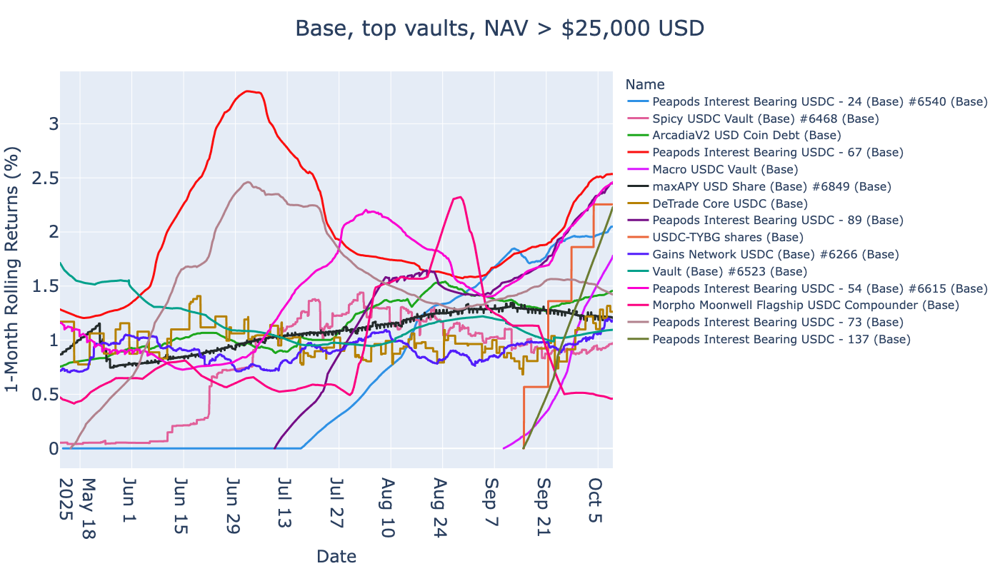

Base: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USDC-TYBG shares,2.26%,40.41%,2.26%,40.41%,7.8,2.26%,40.41%,0.0027,USDC,"30,406.59","25,425.09",0.07,unknown,unknown,31,<unknown ERC-4626>,8453-0xa653f93fc9dfe6d6cbc2abd04227a3d9999af69a,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 137,2.23%,39.86%,2.23%,39.86%,68.5,2.23%,39.86%,0.0003,USDC,"114,704.73","68,279.21",0.07,unknown,unknown,372,Peapods,8453-0xf62e2a8ffc2cb285e33b552dc893c948d47d09d5,2025-09-14 19:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 54,14.22%,23.51%,6.16%,27.78%,199.3,2.46%,35.81%,0.0001,USDC,"38,581.18","27,859.33",0.63,unknown,unknown,"4,916",Peapods,8453-0xc31dc3ca0f638c6db8992906cf96a5b13befdd91,2025-09-09 01:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 67,13.97%,27.59%,6.11%,27.56%,285.1,2.54%,37.07%,0.0000,USDC,"203,067.01","155,456.30",0.54,unknown,unknown,"5,928",Peapods,8453-0x5f6511489c9e770a07fb1ae2969abe350a3d2cf4,2025-09-09 01:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 89,5.74%,25.10%,5.63%,25.18%,59.4,2.45%,35.60%,0.0002,USDC,"172,868.03","170,615.14",0.25,unknown,unknown,"1,947",Peapods,8453-0x8e792b54a8ff4d6441db65e9c52dce35249732f4,2025-09-09 01:02:57,2025-10-09 00:02:57
Macro USDC Vault,1.78%,24.88%,1.78%,24.88%,69.8,1.78%,24.88%,0.0002,USDC,"1,406,999.55","1,378,157.43",0.08,0.00%,15.00%,909,Morpho,8453-0x68aa3790a192e46810a8b423980b96924662bba8,2025-09-09 12:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 24,6.64%,10.23%,4.63%,20.39%,166.2,2.05%,29.13%,0.0001,USDC,"136,529.02","92,204.63",0.66,unknown,unknown,"4,837",Peapods,8453-0x02c9428716b6dc4062eb8ba1b2769704b9e24851,2025-09-09 01:02:57,2025-10-09 00:02:57
Peapods Interest Bearing USDC - 73,8.29%,22.06%,4.37%,19.20%,179.0,1.42%,19.47%,0.0001,USDC,"788,925.37","503,444.14",0.40,unknown,unknown,"21,712",Peapods,8453-0xf0de996292a195dbb5fc94ff1899781c874a9750,2025-09-09 01:02:57,2025-10-09 00:02:57
ArcadiaV2 USD Coin Debt,21.66%,13.51%,4.24%,18.57%,269.9,1.46%,19.96%,0.0000,USDC,"6,550,028.20","4,149,969.51",1.55,unknown,unknown,"34,608",Arcadia Finance,8453-0x3ec4a293fb906dd2cd440c20decb250def141df1,2025-09-09 01:02:57,2025-10-09 00:02:57


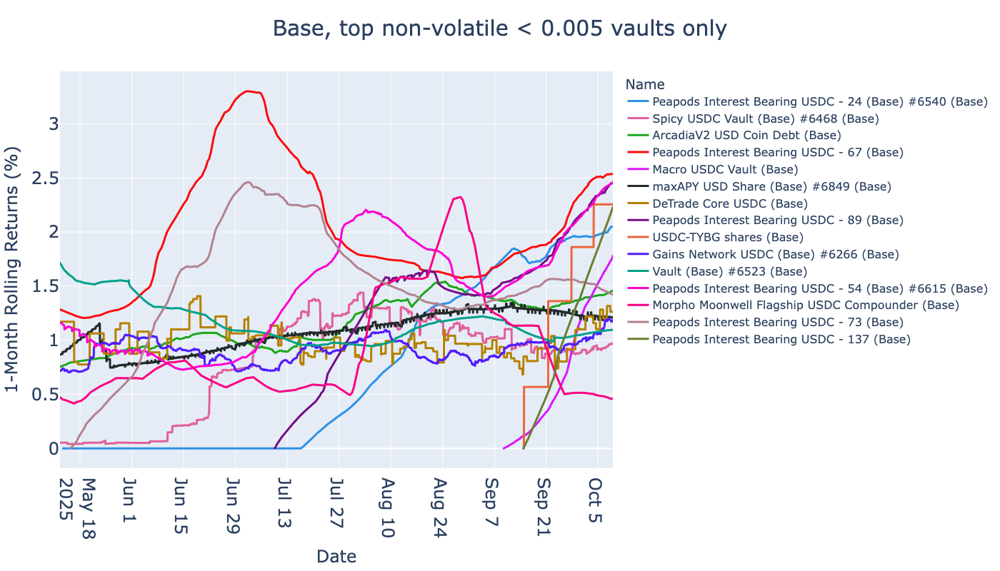

### Binance

Binance: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
K3 Capital ASTERLIQUID USDT,0.27%,22.04%,0.27%,22.04%,46.7,0.27%,22.04%,0.0001,USDT,"4,983,664.45","4,779,068.03",0.01,unknown,unknown,337,Euler Vault Kit,56-0x95c5fd8618c68d6156a739c1eab5aa7c807ff148,2025-10-03 16:29:36,2025-10-09 00:47:04
Re7 Labs USD1,3.29%,11.93%,3.19%,13.75%,88.3,1.20%,16.23%,0.0000,USD1,"21,570,451.80","5,613,620.97",0.29,unknown,unknown,"5,392",Euler Vault Kit,56-0xc41f2ba7102e9f9f2d603eb951f955ae205ed272,2025-09-09 01:02:24,2025-10-09 00:47:04
Re7 Labs USDT,4.58%,9.86%,3.11%,13.41%,107.2,1.07%,14.37%,0.0000,USDT,"13,954,550.91","2,935,843.78",0.48,unknown,unknown,"16,656",Euler Vault Kit,56-0x69a93dbab609266af96f05658b2e22d020de2e19,2025-09-09 01:02:24,2025-10-09 00:47:04
Matrix USDC (Multipli),1.35%,9.16%,1.35%,9.16%,2.2,0.59%,7.70%,0.0006,USDC,"489,017.47","205,112.56",0.15,unknown,unknown,691,<unknown ERC-4626>,56-0x4320e5ae6f08ffcf6175fb558ee4c0ec41b86de9,2025-09-09 01:02:24,2025-10-09 00:47:04
MEV USDT Vault,2.62%,6.63%,2.04%,8.63%,100.0,0.78%,10.24%,0.0000,USDT,"95,234,908.80","24,410,389.27",0.40,unknown,unknown,"8,608",<unknown ERC-4626>,56-0x6402d64f035e18f9834591d3b994dfe41a0f162d,2025-09-09 01:02:24,2025-10-09 00:47:04
Staked YUSD,2.06%,6.10%,1.91%,8.08%,9.2,0.45%,5.87%,0.0001,YUSD,"1,029,090.67","999,987.63",0.34,unknown,unknown,143,<unknown ERC-4626>,56-0x24db057b19241eefb9b522e8627c293ed8f93af2,2025-09-09 01:02:24,2025-10-09 00:47:04
Statera Vault USDT,0.10%,7.33%,0.10%,7.33%,27.4,0.10%,7.33%,0.0000,USDT,"2,094,314.87","1,702,369.12",0.01,unknown,unknown,548,<unknown ERC-4626>,56-0x3bd8bdaaa1aff2bb17866fc897bba5add9b64e3a,2025-10-03 16:29:36,2025-10-09 00:47:04
Re7 USD1,1.73%,6.60%,1.73%,7.29%,48.5,1.24%,16.77%,0.0000,USD1,"8,684,828.31","3,347,501.32",0.27,unknown,unknown,"1,764",<unknown ERC-4626>,56-0x02a5ca3a749855d1002a78813e679584a96646d0,2025-09-09 01:02:24,2025-10-09 00:47:04
Staked USDX,11.05%,6.96%,1.71%,7.21%,40.5,0.48%,6.16%,0.0000,USDX,"304,373,562.64","236,080,255.91",1.56,unknown,unknown,"27,888",<unknown ERC-4626>,56-0x7788a3538c5fc7f9c7c8a74eac4c898fc8d87d92,2025-09-09 01:02:24,2025-10-09 00:47:04


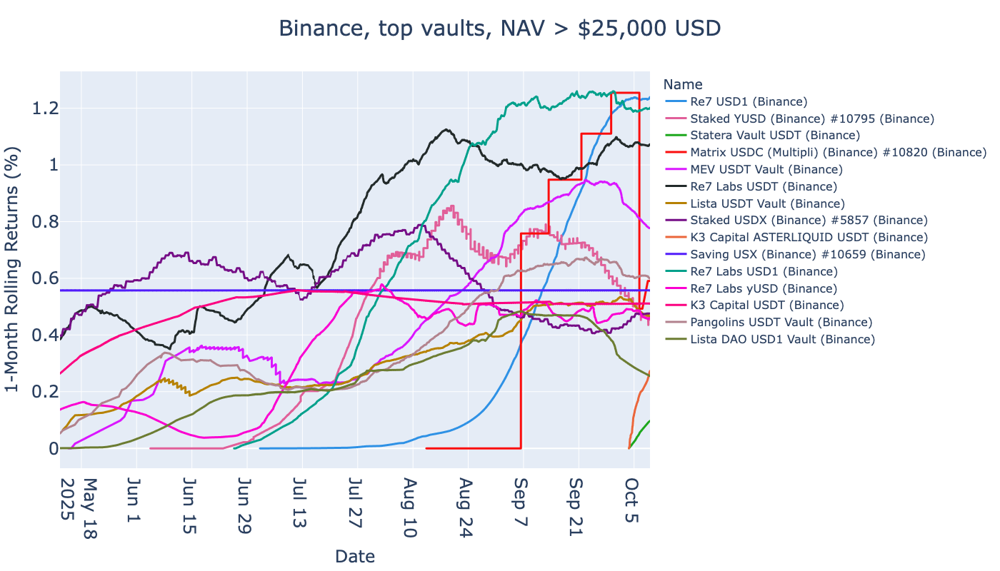

Binance: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
K3 Capital ASTERLIQUID USDT,0.27%,22.04%,0.27%,22.04%,46.7,0.27%,22.04%,0.0001,USDT,"4,983,664.45","4,779,068.03",0.01,unknown,unknown,337,Euler Vault Kit,56-0x95c5fd8618c68d6156a739c1eab5aa7c807ff148,2025-10-03 16:29:36,2025-10-09 00:47:04
Re7 Labs USD1,3.29%,11.93%,3.19%,13.75%,88.3,1.20%,16.23%,0.0000,USD1,"21,570,451.80","5,613,620.97",0.29,unknown,unknown,"5,392",Euler Vault Kit,56-0xc41f2ba7102e9f9f2d603eb951f955ae205ed272,2025-09-09 01:02:24,2025-10-09 00:47:04
Re7 Labs USDT,4.58%,9.86%,3.11%,13.41%,107.2,1.07%,14.37%,0.0000,USDT,"13,954,550.91","2,935,843.78",0.48,unknown,unknown,"16,656",Euler Vault Kit,56-0x69a93dbab609266af96f05658b2e22d020de2e19,2025-09-09 01:02:24,2025-10-09 00:47:04
Matrix USDC (Multipli),1.35%,9.16%,1.35%,9.16%,2.2,0.59%,7.70%,0.0006,USDC,"489,017.47","205,112.56",0.15,unknown,unknown,691,<unknown ERC-4626>,56-0x4320e5ae6f08ffcf6175fb558ee4c0ec41b86de9,2025-09-09 01:02:24,2025-10-09 00:47:04
MEV USDT Vault,2.62%,6.63%,2.04%,8.63%,100.0,0.78%,10.24%,0.0000,USDT,"95,234,908.80","24,410,389.27",0.40,unknown,unknown,"8,608",<unknown ERC-4626>,56-0x6402d64f035e18f9834591d3b994dfe41a0f162d,2025-09-09 01:02:24,2025-10-09 00:47:04
Staked YUSD,2.06%,6.10%,1.91%,8.08%,9.2,0.45%,5.87%,0.0001,YUSD,"1,029,090.67","999,987.63",0.34,unknown,unknown,143,<unknown ERC-4626>,56-0x24db057b19241eefb9b522e8627c293ed8f93af2,2025-09-09 01:02:24,2025-10-09 00:47:04
Statera Vault USDT,0.10%,7.33%,0.10%,7.33%,27.4,0.10%,7.33%,0.0000,USDT,"2,094,314.87","1,702,369.12",0.01,unknown,unknown,548,<unknown ERC-4626>,56-0x3bd8bdaaa1aff2bb17866fc897bba5add9b64e3a,2025-10-03 16:29:36,2025-10-09 00:47:04
Re7 USD1,1.73%,6.60%,1.73%,7.29%,48.5,1.24%,16.77%,0.0000,USD1,"8,684,828.31","3,347,501.32",0.27,unknown,unknown,"1,764",<unknown ERC-4626>,56-0x02a5ca3a749855d1002a78813e679584a96646d0,2025-09-09 01:02:24,2025-10-09 00:47:04
Staked USDX,11.05%,6.96%,1.71%,7.21%,40.5,0.48%,6.16%,0.0000,USDX,"304,373,562.64","236,080,255.91",1.56,unknown,unknown,"27,888",<unknown ERC-4626>,56-0x7788a3538c5fc7f9c7c8a74eac4c898fc8d87d92,2025-09-09 01:02:24,2025-10-09 00:47:04


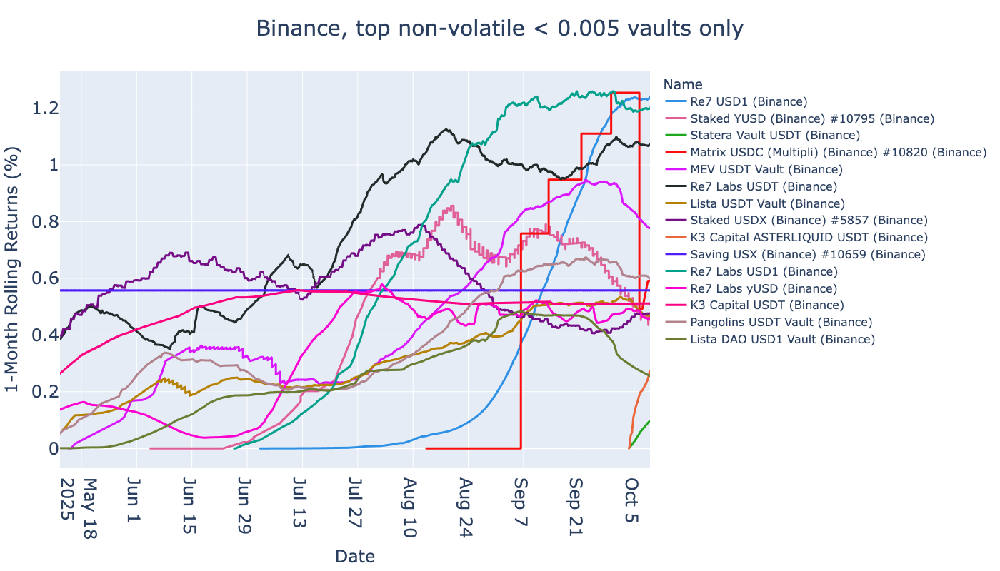

### Arbitrum

Arbitrum: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 25,3.39%,33.59%,3.39%,33.59%,150.6,1.83%,25.59%,0.0001,USDC,"430,028.63","107,965.83",0.11,unknown,unknown,"1,408",Peapods,42161-0xd15a07a4150b0c057912fe883f7ad22b97161591,2025-09-09 01:10:25,2025-10-09 00:24:39
Plutus Hedge Token,13.87%,20.72%,7.05%,32.26%,2.8,0.00%,0.00%,0.0060,USDC,"257,194.27","255,977.55",0.69,unknown,unknown,60,<unknown ERC-4626>,42161-0x58bfc95a864e18e8f3041d2fcd3418f48393fe6a,2025-09-09 01:10:25,2025-10-09 00:24:39
FARM_USDC,1.99%,28.24%,1.99%,28.24%,65.1,1.99%,28.24%,0.0002,USDC,"2,500,562.84","2,500,562.84",0.08,unknown,unknown,562,Harvest Finance,42161-0x2d5fde3d24ed3e7c548a59039eee5af8200f9291,2025-09-09 10:09:43,2025-10-09 00:24:39
HYPE++,39.39%,45.75%,6.24%,28.22%,3.5,2.54%,37.10%,0.0043,USDC,"6,241,538.82","3,541,406.72",0.88,unknown,unknown,224,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 6,21.05%,33.26%,6.16%,27.78%,206.2,2.69%,39.66%,0.0001,USDC,"4,599,069.91","3,050,925.84",0.67,unknown,unknown,"8,538",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,2025-09-09 01:10:25,2025-10-09 00:24:39
Short Volatility - WETH/USDCe-P,12.41%,5.64%,5.98%,26.92%,2.5,-0.16%,-2.05%,0.0059,USDC,"1,956,459.57","67,415.13",2.13,unknown,unknown,"1,205",<unknown ERC-4626>,42161-0xd46993f25d298ebbcd31e941156c66f7e628a52a,2025-09-09 01:10:25,2025-10-09 00:24:39
Curve Vault for crvUSD,28.13%,17.93%,4.47%,19.67%,346.5,1.63%,22.51%,0.0000,crvUSD,"118,708.44","28,785.62",1.50,unknown,unknown,270,<unknown ERC-4626>,42161-0xeba51f6472f4ce1c47668c2474ab8f84b32e1ae7,2025-09-09 01:10:25,2025-10-09 00:24:39
Silo Finance Borrowable USDC Deposit in ARB Silo,11.72%,11.30%,3.62%,15.73%,53.8,1.49%,20.48%,0.0002,USDC,"594,410.52","170,434.56",1.03,unknown,unknown,241,<unknown ERC-4626>,42161-0xb739ae19620f7ecb4fb84727f205453aa5bc1ad2,2025-09-09 01:10:25,2025-10-09 00:24:39
ostiumLP,14.09%,10.98%,3.60%,15.62%,2.0,3.48%,53.90%,0.0045,USDC,"68,095,256.35","29,030,245.33",1.26,unknown,unknown,"15,781",Ostium,42161-0x20d419a8e12c45f88fda7c5760bb6923cee27f98,2025-09-09 01:10:25,2025-10-09 00:24:39


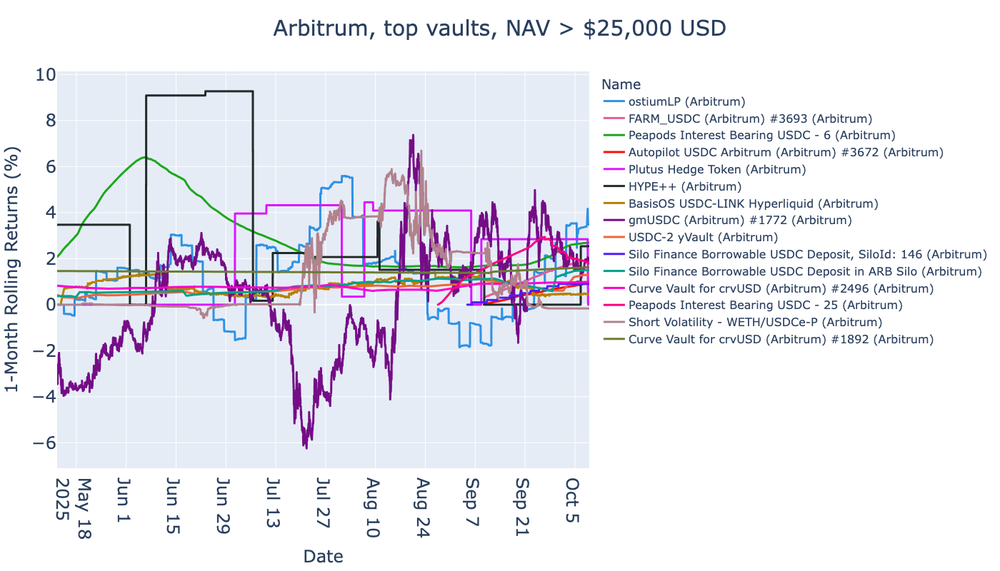

Arbitrum: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 25,3.39%,33.59%,3.39%,33.59%,150.6,1.83%,25.59%,0.0001,USDC,"430,028.63","107,965.83",0.11,unknown,unknown,"1,408",Peapods,42161-0xd15a07a4150b0c057912fe883f7ad22b97161591,2025-09-09 01:10:25,2025-10-09 00:24:39
FARM_USDC,1.99%,28.24%,1.99%,28.24%,65.1,1.99%,28.24%,0.0002,USDC,"2,500,562.84","2,500,562.84",0.08,unknown,unknown,562,Harvest Finance,42161-0x2d5fde3d24ed3e7c548a59039eee5af8200f9291,2025-09-09 10:09:43,2025-10-09 00:24:39
HYPE++,39.39%,45.75%,6.24%,28.22%,3.5,2.54%,37.10%,0.0043,USDC,"6,241,538.82","3,541,406.72",0.88,unknown,unknown,224,<unknown ERC-4626>,42161-0x75288264fdfea8ce68e6d852696ab1ce2f3e5004,2025-09-09 01:10:25,2025-10-09 00:24:39
Peapods Interest Bearing USDC - 6,21.05%,33.26%,6.16%,27.78%,206.2,2.69%,39.66%,0.0001,USDC,"4,599,069.91","3,050,925.84",0.67,unknown,unknown,"8,538",Peapods,42161-0x3a87cf9af4d21778dad1ce7d0bf053f4b8f2631f,2025-09-09 01:10:25,2025-10-09 00:24:39
Curve Vault for crvUSD,28.13%,17.93%,4.47%,19.67%,346.5,1.63%,22.51%,0.0000,crvUSD,"118,708.44","28,785.62",1.50,unknown,unknown,270,<unknown ERC-4626>,42161-0xeba51f6472f4ce1c47668c2474ab8f84b32e1ae7,2025-09-09 01:10:25,2025-10-09 00:24:39
Silo Finance Borrowable USDC Deposit in ARB Silo,11.72%,11.30%,3.62%,15.73%,53.8,1.49%,20.48%,0.0002,USDC,"594,410.52","170,434.56",1.03,unknown,unknown,241,<unknown ERC-4626>,42161-0xb739ae19620f7ecb4fb84727f205453aa5bc1ad2,2025-09-09 01:10:25,2025-10-09 00:24:39
ostiumLP,14.09%,10.98%,3.60%,15.62%,2.0,3.48%,53.90%,0.0045,USDC,"68,095,256.35","29,030,245.33",1.26,unknown,unknown,"15,781",Ostium,42161-0x20d419a8e12c45f88fda7c5760bb6923cee27f98,2025-09-09 01:10:25,2025-10-09 00:24:39
USDC-2 yVault,10.59%,8.10%,3.05%,13.12%,78.3,1.29%,17.51%,0.0001,USDC,"2,171,188.03","198,116.83",1.29,unknown,unknown,"1,715",Yearn v3,42161-0x9fa306b1f4a6a83fec98d8ebbabedff78c407f6b,2025-09-09 01:10:25,2025-10-09 00:24:39
Autopilot USDC Arbitrum,0.93%,12.35%,0.93%,12.35%,78.7,0.93%,12.35%,0.0001,USDC,"1,636,133.41","1,285,010.53",0.08,0.30%,2.00%,"1,167",IPOR,42161-0x407d3d942d0911a2fea7e22417f81e27c02d6c6f,2025-09-09 10:09:43,2025-10-09 00:24:39


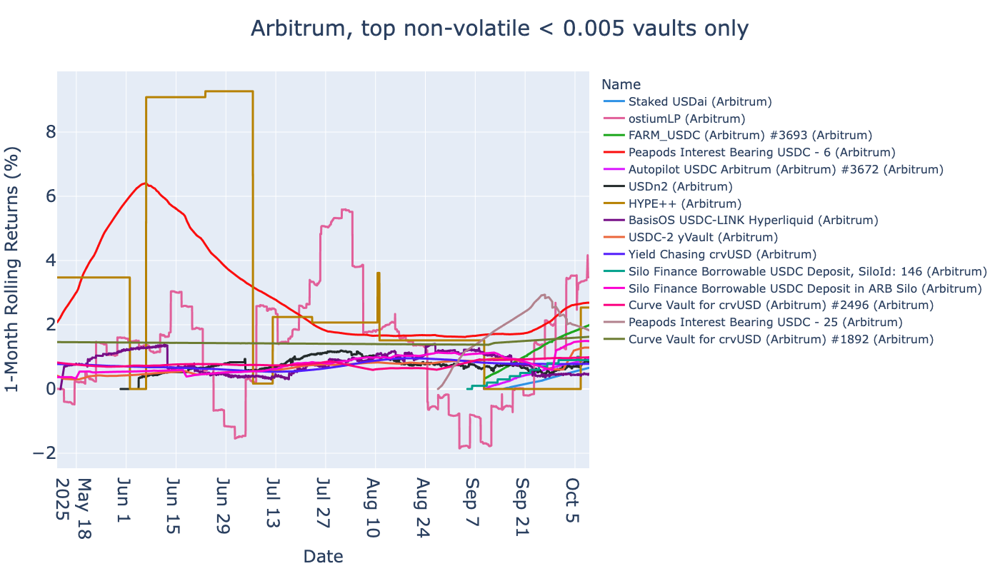

### Avalanche

Avalanche: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
40avax-USDC-VAULT,-100.00%,-100.00%,4.24%,18.57%,71.7,1.29%,17.50%,0.0001,USDC,"1,902,372.15","1,547,816.54",0.28,unknown,unknown,"2,099",<unknown ERC-4626>,43114-0x124d00b1ce4453ffc5a5f65ce83af13a7709bac7,2025-09-09 01:01:41,2025-10-09 00:26:02
Staked avUSD,9.50%,10.66%,3.75%,16.29%,63.2,1.26%,17.02%,0.0001,avUSD,"127,306,145.49","126,859,615.48",0.90,unknown,unknown,"4,787",<unknown ERC-4626>,43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e,2025-09-09 01:01:41,2025-10-09 00:26:02
Spectra ERC4626 Wrapper: EVK Vault esdeUSD-3,0.04%,15.09%,0.04%,15.09%,241.3,0.04%,15.09%,0.0000,deUSD,"842,029.62","842,029.62",0.00,unknown,unknown,33,<unknown ERC-4626>,43114-0xb9003d5bed06afd570139d21c64817298dd47ec1,2025-10-07 03:24:04,2025-10-09 00:26:02
"Silo Finance Borrowable USDC Deposit, SiloId: 123",0.50%,6.72%,0.30%,14.62%,10.1,0.00%,0.00%,0.0006,USDC,"29,911,584.56","333,875.35",0.08,unknown,unknown,604,<unknown ERC-4626>,43114-0x1ce6845b2996e4b0dcba0af7daae5454e2c43f6a,2025-07-11 01:14:03,2025-07-19 16:12:19
"Silo Finance Borrowable USDC Deposit, SiloId: 125",3.10%,12.89%,3.10%,13.35%,10.4,1.48%,20.27%,0.0006,USDC,"47,169,867.23","8,520,052.71",0.25,unknown,unknown,"9,033",<unknown ERC-4626>,43114-0xe0345f66318f482acccd67244a921c7fdc410957,2025-09-09 01:01:41,2025-10-09 00:26:02
"Silo Finance Borrowable USDt Deposit, SiloId: 136",1.89%,13.02%,1.89%,13.02%,10.2,1.19%,16.04%,0.0006,USDt,"1,122,230.91","1,075,298.47",0.15,unknown,unknown,324,<unknown ERC-4626>,43114-0xe0fc62e685e2b3183b4b88b1fe674cfec55a63f7,2025-09-09 01:01:41,2025-10-09 00:26:02
"Silo Finance Borrowable AUSD Deposit, SiloId: 135",1.89%,13.02%,1.89%,13.02%,10.2,1.09%,14.60%,0.0006,AUSD,"2,135,266.48","1,650,689.95",0.15,unknown,unknown,"1,203",<unknown ERC-4626>,43114-0xd1dd7f8affbdef3594d84245eadac0940d9394c3,2025-09-09 01:01:41,2025-10-09 00:26:02
"Silo Finance Borrowable AUSD Deposit, SiloId: 134",1.79%,12.30%,1.79%,12.30%,9.9,0.89%,11.80%,0.0006,AUSD,"1,097,750.11","900,122.02",0.15,unknown,unknown,144,<unknown ERC-4626>,43114-0x9c4d4800b489d217724155399cd64d07eae603f3,2025-09-09 01:01:41,2025-10-09 00:26:02
Re7 Labs USDT,5.72%,11.81%,2.82%,12.07%,76.1,0.76%,10.05%,0.0001,USDt,"536,269.02","38,494.72",0.50,unknown,unknown,"2,114",Euler Vault Kit,43114-0xaba9d2d4b6b93c3dc8976d8eb0690cca56431fe4,2025-09-09 01:01:41,2025-10-09 00:26:02


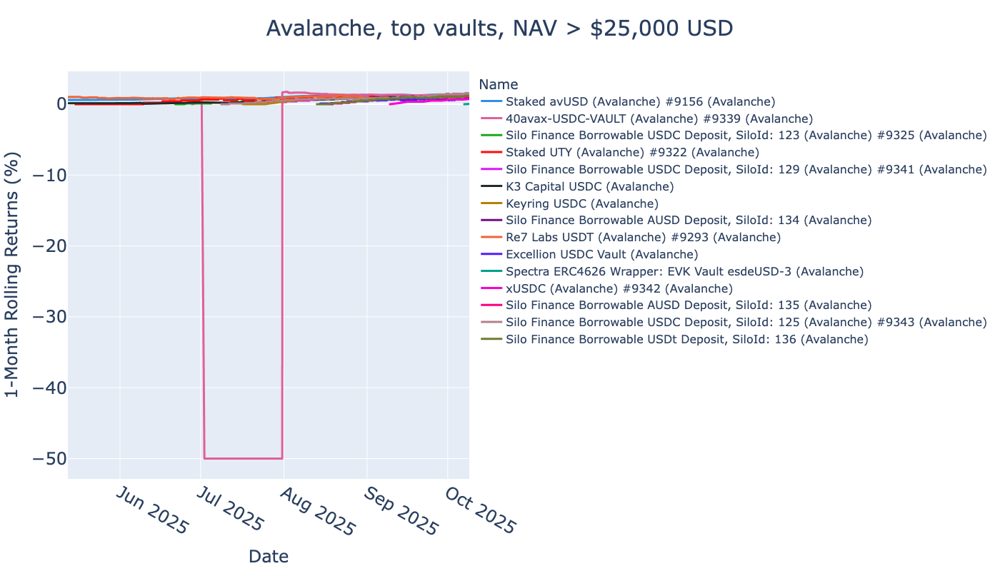

Avalanche: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
40avax-USDC-VAULT,-100.00%,-100.00%,4.24%,18.57%,71.7,1.29%,17.50%,0.0001,USDC,"1,902,372.15","1,547,816.54",0.28,unknown,unknown,"2,099",<unknown ERC-4626>,43114-0x124d00b1ce4453ffc5a5f65ce83af13a7709bac7,2025-09-09 01:01:41,2025-10-09 00:26:02
Staked avUSD,9.50%,10.66%,3.75%,16.29%,63.2,1.26%,17.02%,0.0001,avUSD,"127,306,145.49","126,859,615.48",0.90,unknown,unknown,"4,787",<unknown ERC-4626>,43114-0x06d47f3fb376649c3a9dafe069b3d6e35572219e,2025-09-09 01:01:41,2025-10-09 00:26:02
Spectra ERC4626 Wrapper: EVK Vault esdeUSD-3,0.04%,15.09%,0.04%,15.09%,241.3,0.04%,15.09%,0.0000,deUSD,"842,029.62","842,029.62",0.00,unknown,unknown,33,<unknown ERC-4626>,43114-0xb9003d5bed06afd570139d21c64817298dd47ec1,2025-10-07 03:24:04,2025-10-09 00:26:02
"Silo Finance Borrowable USDC Deposit, SiloId: 123",0.50%,6.72%,0.30%,14.62%,10.1,0.00%,0.00%,0.0006,USDC,"29,911,584.56","333,875.35",0.08,unknown,unknown,604,<unknown ERC-4626>,43114-0x1ce6845b2996e4b0dcba0af7daae5454e2c43f6a,2025-07-11 01:14:03,2025-07-19 16:12:19
"Silo Finance Borrowable USDC Deposit, SiloId: 125",3.10%,12.89%,3.10%,13.35%,10.4,1.48%,20.27%,0.0006,USDC,"47,169,867.23","8,520,052.71",0.25,unknown,unknown,"9,033",<unknown ERC-4626>,43114-0xe0345f66318f482acccd67244a921c7fdc410957,2025-09-09 01:01:41,2025-10-09 00:26:02
"Silo Finance Borrowable USDt Deposit, SiloId: 136",1.89%,13.02%,1.89%,13.02%,10.2,1.19%,16.04%,0.0006,USDt,"1,122,230.91","1,075,298.47",0.15,unknown,unknown,324,<unknown ERC-4626>,43114-0xe0fc62e685e2b3183b4b88b1fe674cfec55a63f7,2025-09-09 01:01:41,2025-10-09 00:26:02
"Silo Finance Borrowable AUSD Deposit, SiloId: 135",1.89%,13.02%,1.89%,13.02%,10.2,1.09%,14.60%,0.0006,AUSD,"2,135,266.48","1,650,689.95",0.15,unknown,unknown,"1,203",<unknown ERC-4626>,43114-0xd1dd7f8affbdef3594d84245eadac0940d9394c3,2025-09-09 01:01:41,2025-10-09 00:26:02
"Silo Finance Borrowable AUSD Deposit, SiloId: 134",1.79%,12.30%,1.79%,12.30%,9.9,0.89%,11.80%,0.0006,AUSD,"1,097,750.11","900,122.02",0.15,unknown,unknown,144,<unknown ERC-4626>,43114-0x9c4d4800b489d217724155399cd64d07eae603f3,2025-09-09 01:01:41,2025-10-09 00:26:02
Re7 Labs USDT,5.72%,11.81%,2.82%,12.07%,76.1,0.76%,10.05%,0.0001,USDt,"536,269.02","38,494.72",0.50,unknown,unknown,"2,114",Euler Vault Kit,43114-0xaba9d2d4b6b93c3dc8976d8eb0690cca56431fe4,2025-09-09 01:01:41,2025-10-09 00:26:02


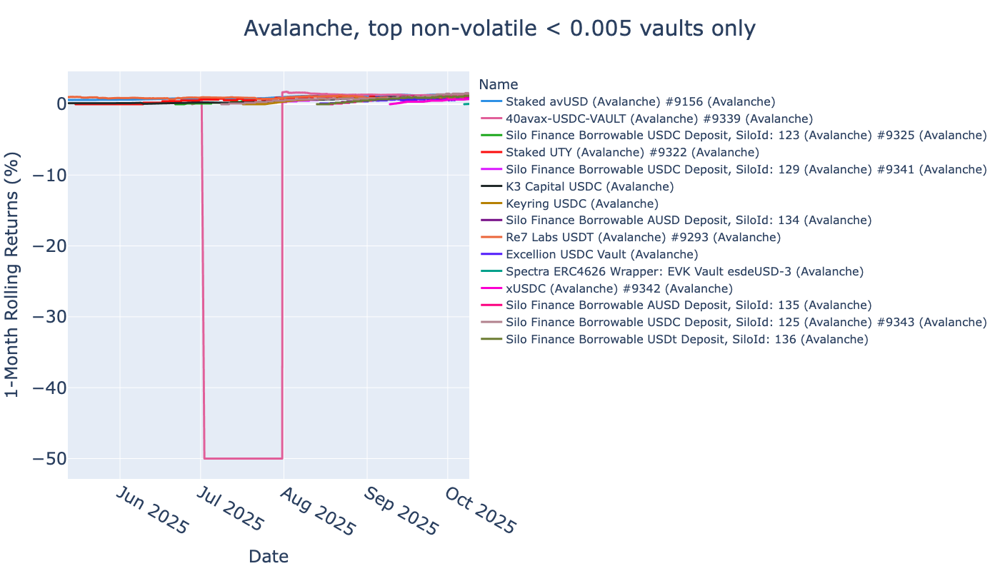

### Linea

Linea: Displaying top 15 vaults based on three months returns, total 10 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USDC Vault,0.43%,4.76%,0.43%,4.76%,317.7,0.39%,4.97%,0.0000,USDC,"475,084.63","69,445.33",0.09,unknown,unknown,199,<unknown ERC-4626>,59144-0xf00be6427f6efc27d065d15c8e3462f0ee41ad6b,2025-09-09 00:55:42,2025-10-09 00:31:22
Re7 Labs USD Cluster USDC,0.57%,4.29%,0.57%,4.29%,171.6,0.43%,5.53%,0.0000,USDC,"101,780,395.46","57,776,888.04",0.13,unknown,unknown,"8,407",Euler Vault Kit,59144-0xfb6448b96637d90fcf2e4ad2c622a487d0496e6f,2025-09-09 00:55:42,2025-10-09 00:31:22
Re7 Labs USD Cluster USDT,0.55%,4.16%,0.55%,4.16%,169.9,0.42%,5.43%,0.0000,USDT,"109,763,994.36","101,883,820.56",0.13,unknown,unknown,"4,771",Euler Vault Kit,59144-0xcbef9be95738290188b25ca9a6dd2bec417a578c,2025-09-09 00:55:42,2025-10-09 00:31:22
Turtle Linea USDC,0.24%,3.22%,0.24%,3.22%,10.9,0.24%,3.22%,0.0002,USDC,"544,512.16","487,141.58",0.08,unknown,unknown,412,Lagoon,59144-0x7df7e45ab573ace8f872b5d5a1689af7ff1a07f7,2025-09-10 07:14:57,2025-10-09 00:31:22
Re7 mUSD,0.09%,1.99%,0.09%,1.99%,166.5,0.09%,1.99%,0.0000,mUSD,"244,488.80","99,899.20",0.04,unknown,unknown,131,<unknown ERC-4626>,59144-0x0b6d98d6250e6f11c86c013caa009b2eacad0d7e,2025-09-22 17:44:00,2025-10-09 00:31:22
MEV Capital mUSD vault,0.08%,1.78%,0.08%,1.78%,165.3,0.08%,1.78%,0.0000,mUSD,"5,121,446.52","5,121,446.52",0.04,unknown,unknown,185,<unknown ERC-4626>,59144-0xb25a72791e6b543a84128791cfc849e5f55f7249,2025-09-22 21:46:27,2025-10-09 00:31:22
Re7 Labs USD Cluster mUSD,0.10%,1.76%,0.10%,1.76%,146.4,0.10%,1.76%,0.0000,mUSD,"136,019,555.78","125,882,156.41",0.06,unknown,unknown,"4,068",Euler Vault Kit,59144-0xa7ada0d422a8b5fa4a7947f2cb0ee2d32435647d,2025-09-17 22:54:27,2025-10-09 00:31:22
Wrapped USK,8.47%,4.38%,0.33%,1.38%,26.8,0.00%,0.00%,0.0000,USK,"103,558.68","28,378.35",1.90,unknown,unknown,477,<unknown ERC-4626>,59144-0x2f0b4300074afc01726262d4cc9c1d2619d7297a,2025-09-09 00:55:42,2025-10-09 00:31:22
ZeroLend USDT,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDT,"3,440,913.05","368,433.87",0.14,unknown,unknown,741,Euler Vault Kit,59144-0x085f80df643307e04f23281f6fdbfaa13865e852,2025-09-09 00:55:42,2025-10-09 00:31:22


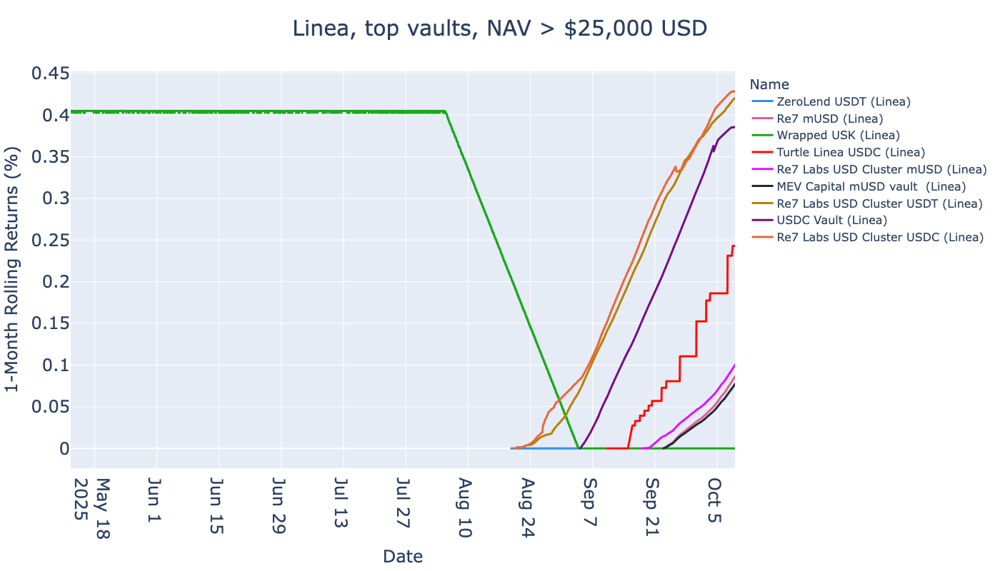

Linea: Displaying top 15 non-volatile vaults based on three months returns, total 10 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USDC Vault,0.43%,4.76%,0.43%,4.76%,317.7,0.39%,4.97%,0.0000,USDC,"475,084.63","69,445.33",0.09,unknown,unknown,199,<unknown ERC-4626>,59144-0xf00be6427f6efc27d065d15c8e3462f0ee41ad6b,2025-09-09 00:55:42,2025-10-09 00:31:22
Re7 Labs USD Cluster USDC,0.57%,4.29%,0.57%,4.29%,171.6,0.43%,5.53%,0.0000,USDC,"101,780,395.46","57,776,888.04",0.13,unknown,unknown,"8,407",Euler Vault Kit,59144-0xfb6448b96637d90fcf2e4ad2c622a487d0496e6f,2025-09-09 00:55:42,2025-10-09 00:31:22
Re7 Labs USD Cluster USDT,0.55%,4.16%,0.55%,4.16%,169.9,0.42%,5.43%,0.0000,USDT,"109,763,994.36","101,883,820.56",0.13,unknown,unknown,"4,771",Euler Vault Kit,59144-0xcbef9be95738290188b25ca9a6dd2bec417a578c,2025-09-09 00:55:42,2025-10-09 00:31:22
Turtle Linea USDC,0.24%,3.22%,0.24%,3.22%,10.9,0.24%,3.22%,0.0002,USDC,"544,512.16","487,141.58",0.08,unknown,unknown,412,Lagoon,59144-0x7df7e45ab573ace8f872b5d5a1689af7ff1a07f7,2025-09-10 07:14:57,2025-10-09 00:31:22
Re7 mUSD,0.09%,1.99%,0.09%,1.99%,166.5,0.09%,1.99%,0.0000,mUSD,"244,488.80","99,899.20",0.04,unknown,unknown,131,<unknown ERC-4626>,59144-0x0b6d98d6250e6f11c86c013caa009b2eacad0d7e,2025-09-22 17:44:00,2025-10-09 00:31:22
MEV Capital mUSD vault,0.08%,1.78%,0.08%,1.78%,165.3,0.08%,1.78%,0.0000,mUSD,"5,121,446.52","5,121,446.52",0.04,unknown,unknown,185,<unknown ERC-4626>,59144-0xb25a72791e6b543a84128791cfc849e5f55f7249,2025-09-22 21:46:27,2025-10-09 00:31:22
Re7 Labs USD Cluster mUSD,0.10%,1.76%,0.10%,1.76%,146.4,0.10%,1.76%,0.0000,mUSD,"136,019,555.78","125,882,156.41",0.06,unknown,unknown,"4,068",Euler Vault Kit,59144-0xa7ada0d422a8b5fa4a7947f2cb0ee2d32435647d,2025-09-17 22:54:27,2025-10-09 00:31:22
Wrapped USK,8.47%,4.38%,0.33%,1.38%,26.8,0.00%,0.00%,0.0000,USK,"103,558.68","28,378.35",1.90,unknown,unknown,477,<unknown ERC-4626>,59144-0x2f0b4300074afc01726262d4cc9c1d2619d7297a,2025-09-09 00:55:42,2025-10-09 00:31:22
ZeroLend USDT,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDT,"3,440,913.05","368,433.87",0.14,unknown,unknown,741,Euler Vault Kit,59144-0x085f80df643307e04f23281f6fdbfaa13865e852,2025-09-09 00:55:42,2025-10-09 00:31:22


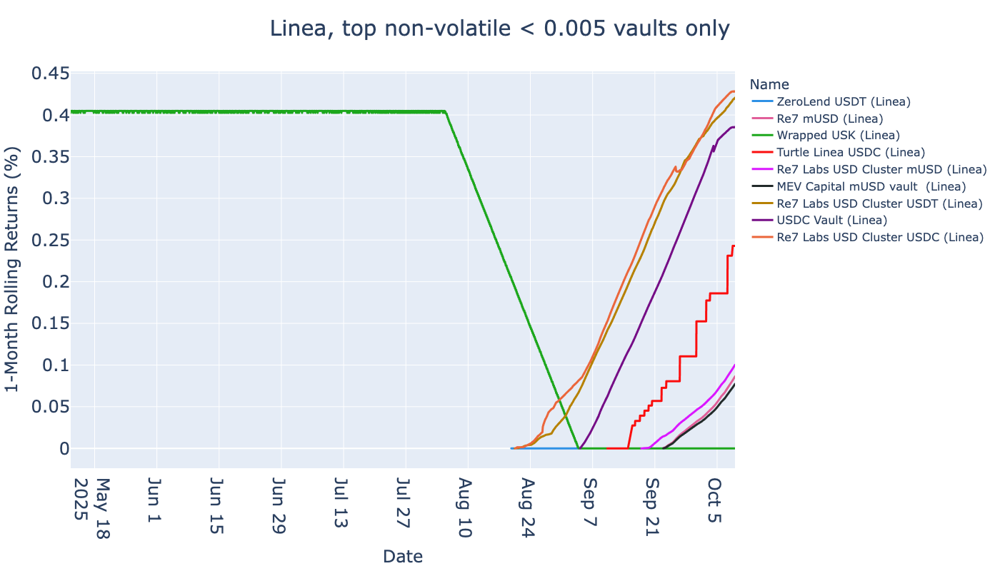

### Gnosis

Gnosis: Displaying top 15 vaults based on three months returns, total 6 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Savings xDAI,20.38%,9.57%,1.35%,5.64%,48.5,0.44%,5.73%,0.0001,WXDAI,"118,849,177.56","103,101,301.61",2.03,unknown,unknown,"1,117,746",<unknown ERC-4626>,100-0xaf204776c7245bf4147c2612bf6e5972ee483701,2025-09-09 00:49:45,2025-10-09 00:18:25
Staked EURA,8.97%,4.17%,0.72%,2.99%,655.7,0.23%,3.00%,0.0000,EURA,"731,376.38","358,698.29",2.10,unknown,unknown,"3,848",<unknown ERC-4626>,100-0x004626a008b1acdc4c74ab51644093b155e59a23,2025-09-09 00:49:45,2025-10-09 00:18:25
SavingsVault ZCHF,0.12%,1.88%,0.12%,1.88%,99.6,0.12%,1.88%,0.0000,ZCHF,"229,653.14","123,438.58",0.07,unknown,unknown,812,<unknown ERC-4626>,100-0x6165946250dd04740ab1409217e95a4f38374fe9,2025-09-14 19:44:10,2025-10-09 00:18:25
Wrapped Aave Gnosis GHO,0.22%,1.48%,0.22%,1.48%,193.5,0.14%,1.82%,0.0000,GHO,"690,714.24","617,880.08",0.15,unknown,unknown,194,<unknown ERC-4626>,100-0x58d9acac48a4077e4909181c48decd00e5ba5de4,2025-09-09 00:49:45,2025-10-09 00:18:25
Prize WXDAI - DAI Savings Rate,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,WXDAI,"1,715,776.44","1,188,223.87",1.05,unknown,unknown,"3,039",<unknown ERC-4626>,100-0xbb7e99abccce01589ad464ff698ad139b0705d90,2025-09-09 00:49:45,2025-10-09 00:18:25
Static Aave Gnosis USDCe,0.36%,2.31%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDC.e,"205,048.47","205,048.47",0.16,unknown,unknown,"4,340",Superform,100-0xf0e7ec247b918311afa054e0aedb99d74c31b809,2024-09-03 21:43:05,2024-10-31 19:25:55


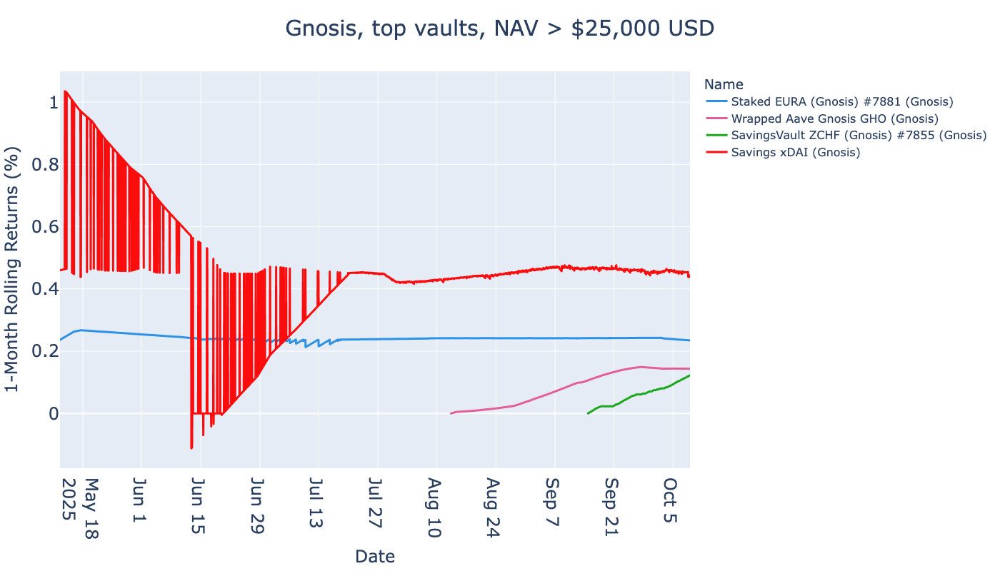

Gnosis: Displaying top 15 non-volatile vaults based on three months returns, total 6 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Savings xDAI,20.38%,9.57%,1.35%,5.64%,48.5,0.44%,5.73%,0.0001,WXDAI,"118,849,177.56","103,101,301.61",2.03,unknown,unknown,"1,117,746",<unknown ERC-4626>,100-0xaf204776c7245bf4147c2612bf6e5972ee483701,2025-09-09 00:49:45,2025-10-09 00:18:25
Staked EURA,8.97%,4.17%,0.72%,2.99%,655.7,0.23%,3.00%,0.0000,EURA,"731,376.38","358,698.29",2.10,unknown,unknown,"3,848",<unknown ERC-4626>,100-0x004626a008b1acdc4c74ab51644093b155e59a23,2025-09-09 00:49:45,2025-10-09 00:18:25
SavingsVault ZCHF,0.12%,1.88%,0.12%,1.88%,99.6,0.12%,1.88%,0.0000,ZCHF,"229,653.14","123,438.58",0.07,unknown,unknown,812,<unknown ERC-4626>,100-0x6165946250dd04740ab1409217e95a4f38374fe9,2025-09-14 19:44:10,2025-10-09 00:18:25
Wrapped Aave Gnosis GHO,0.22%,1.48%,0.22%,1.48%,193.5,0.14%,1.82%,0.0000,GHO,"690,714.24","617,880.08",0.15,unknown,unknown,194,<unknown ERC-4626>,100-0x58d9acac48a4077e4909181c48decd00e5ba5de4,2025-09-09 00:49:45,2025-10-09 00:18:25
Prize WXDAI - DAI Savings Rate,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,WXDAI,"1,715,776.44","1,188,223.87",1.05,unknown,unknown,"3,039",<unknown ERC-4626>,100-0xbb7e99abccce01589ad464ff698ad139b0705d90,2025-09-09 00:49:45,2025-10-09 00:18:25
Static Aave Gnosis USDCe,0.36%,2.31%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDC.e,"205,048.47","205,048.47",0.16,unknown,unknown,"4,340",Superform,100-0xf0e7ec247b918311afa054e0aedb99d74c31b809,2024-09-03 21:43:05,2024-10-31 19:25:55


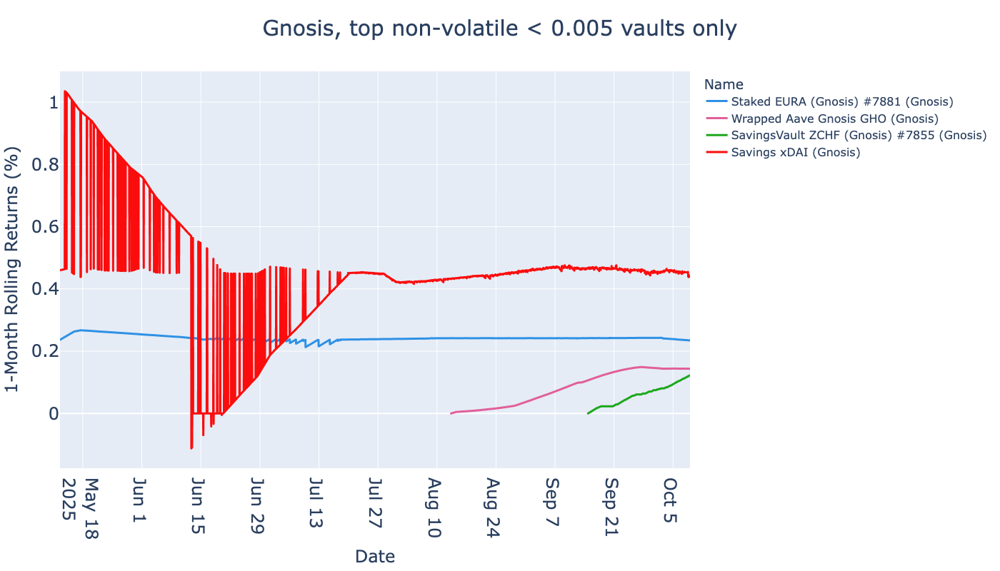

### Hemi

Hemi: Displaying top 15 vaults based on three months returns, total 2 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
"USDC.e - wBTC, hemiBTC and ETH",0.00%,0.00%,0.00%,0.00%,4.4,0.00%,0.01%,0.0000,USDC.e,"508,065.08","37,714.63",0.22,unknown,unknown,488,<unknown ERC-4626>,43111-0x614eb485de3c6c49701b40806ac1b985ad6f0a2f,2025-09-09 01:34:11,2025-10-09 00:34:11
satUSD_plus,0.39%,0.85%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,satUSD,"62,529,647.18","54,585,210.32",0.46,unknown,unknown,63,<unknown ERC-4626>,43111-0x1324285bb2ddadfc9bebc2f8fc5049d7985312c0,2025-09-09 01:34:11,2025-10-09 00:34:11


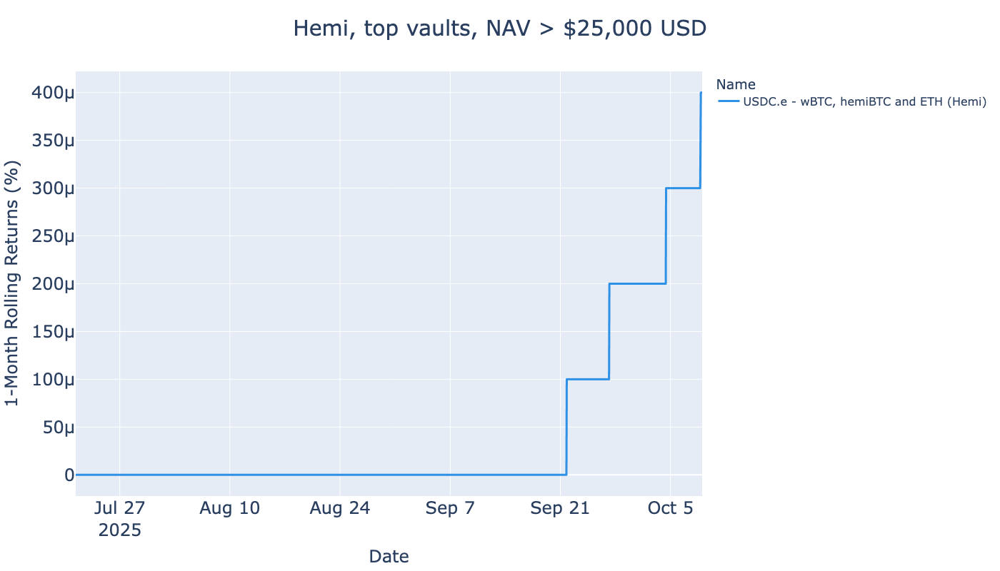

Hemi: Displaying top 15 non-volatile vaults based on three months returns, total 2 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
"USDC.e - wBTC, hemiBTC and ETH",0.00%,0.00%,0.00%,0.00%,4.4,0.00%,0.01%,0.0000,USDC.e,"508,065.08","37,714.63",0.22,unknown,unknown,488,<unknown ERC-4626>,43111-0x614eb485de3c6c49701b40806ac1b985ad6f0a2f,2025-09-09 01:34:11,2025-10-09 00:34:11
satUSD_plus,0.39%,0.85%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,satUSD,"62,529,647.18","54,585,210.32",0.46,unknown,unknown,63,<unknown ERC-4626>,43111-0x1324285bb2ddadfc9bebc2f8fc5049d7985312c0,2025-09-09 01:34:11,2025-10-09 00:34:11


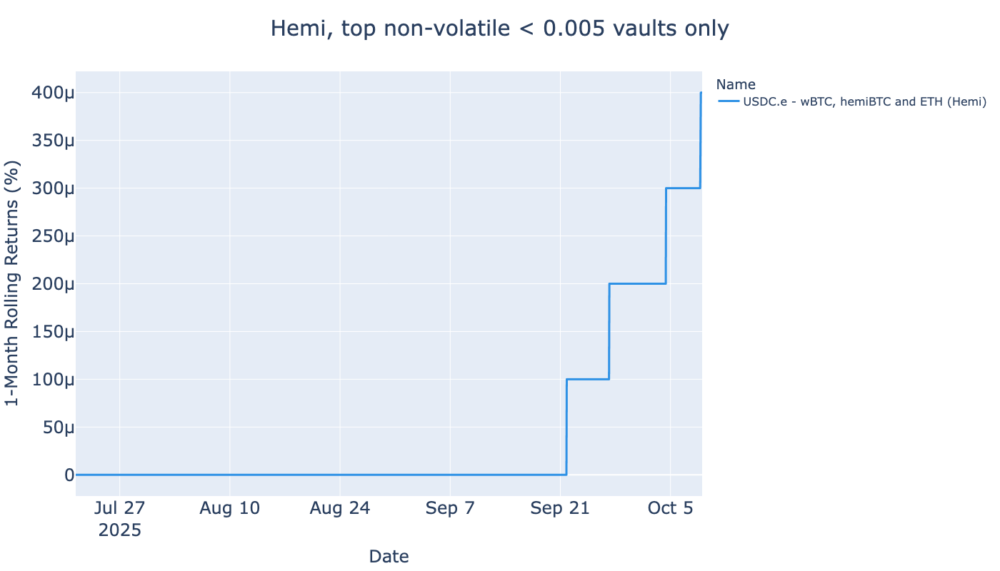

### Optimism

Optimism: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
40op-USDC-Vault,12.99%,21.82%,3.66%,15.87%,343.8,1.07%,14.32%,0.0000,USDC,"1,865,293.69","1,071,242.90",0.62,unknown,unknown,"2,245",<unknown ERC-4626>,10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957,2025-09-09 00:55:27,2025-10-08 23:55:27
Curve Vault for crvUSD,1.53%,2.88%,1.26%,5.26%,112.6,0.57%,7.38%,0.0000,crvUSD,"717,447.81","93,475.39",0.53,unknown,unknown,373,<unknown ERC-4626>,10-0x451200382d931f62b2d2bc9c215d99aa106dc8d0,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 USDC,8.22%,5.51%,1.15%,4.82%,438.1,0.41%,5.31%,0.0000,USDC,"4,989,855.57","1,672,694.69",1.47,unknown,unknown,"32,512",<unknown ERC-4626>,10-0xbe3b918cab6d57a40d1bfb21aeeb5ddf088f4c76,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 USDC,5.27%,5.40%,1.15%,4.82%,435.0,0.41%,5.31%,0.0000,USDC,"3,172,382.48","138,818.97",0.98,unknown,unknown,"3,775",<unknown ERC-4626>,10-0xe6d87294db6eccf91baeecef341be48ea004414a,2025-09-09 00:55:27,2025-10-08 23:55:27
exactly USDC,8.24%,5.50%,1.15%,4.79%,394.5,0.41%,5.35%,0.0000,USDC,"14,824,337.23","3,128,671.85",1.48,unknown,unknown,"179,012",<unknown ERC-4626>,10-0x6926b434cce9b5b7966ae1bfeef6d0a7dcf3a8bb,2025-09-09 00:55:27,2025-10-08 23:55:27
Static Aave Optimism USDT,9.77%,6.10%,1.15%,4.79%,427.9,0.39%,5.05%,0.0000,USDT,"239,205.19","34,389.80",1.57,unknown,unknown,"17,641",Superform,10-0x035c93db04e5aaea54e6cd0261c492a3e0638b37,2025-09-09 00:55:27,2025-10-08 23:55:27
Spark USDC Vault,1.60%,4.64%,1.13%,4.74%,586.9,0.38%,4.91%,0.0000,USDC,"78,490,356.67","43,739,611.91",0.35,unknown,unknown,"7,848",<unknown ERC-4626>,10-0xcf9326e24ebffbef22ce1050007a43a3c0b6db55,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 DAI,8.14%,5.46%,1.07%,4.47%,366.5,0.41%,5.34%,0.0000,DAI,"533,627.70","129,163.36",1.47,unknown,unknown,"3,801",<unknown ERC-4626>,10-0x5e37a7f427ef8b3d507acd3bd16db3ffa755bacc,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 LUSD,7.53%,5.05%,0.71%,2.96%,283.4,0.21%,2.67%,0.0000,LUSD,"506,220.15","43,655.78",1.47,unknown,unknown,"2,715",<unknown ERC-4626>,10-0x420caf26f8be24478c454c4130047035ed23d46d,2025-09-09 00:55:27,2025-10-08 23:55:27


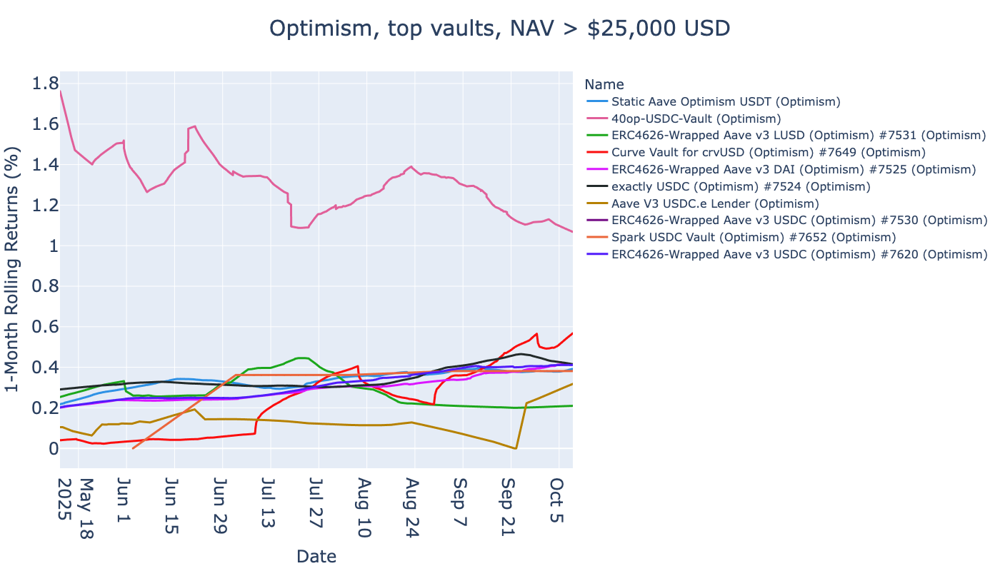

Optimism: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
40op-USDC-Vault,12.99%,21.82%,3.66%,15.87%,343.8,1.07%,14.32%,0.0000,USDC,"1,865,293.69","1,071,242.90",0.62,unknown,unknown,"2,245",<unknown ERC-4626>,10-0x08dcdbf7bade91ccd42cb2a4ea8e5d199d285957,2025-09-09 00:55:27,2025-10-08 23:55:27
Curve Vault for crvUSD,1.53%,2.88%,1.26%,5.26%,112.6,0.57%,7.38%,0.0000,crvUSD,"717,447.81","93,475.39",0.53,unknown,unknown,373,<unknown ERC-4626>,10-0x451200382d931f62b2d2bc9c215d99aa106dc8d0,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 USDC,8.22%,5.51%,1.15%,4.82%,438.1,0.41%,5.31%,0.0000,USDC,"4,989,855.57","1,672,694.69",1.47,unknown,unknown,"32,512",<unknown ERC-4626>,10-0xbe3b918cab6d57a40d1bfb21aeeb5ddf088f4c76,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 USDC,5.27%,5.40%,1.15%,4.82%,435.0,0.41%,5.31%,0.0000,USDC,"3,172,382.48","138,818.97",0.98,unknown,unknown,"3,775",<unknown ERC-4626>,10-0xe6d87294db6eccf91baeecef341be48ea004414a,2025-09-09 00:55:27,2025-10-08 23:55:27
exactly USDC,8.24%,5.50%,1.15%,4.79%,394.5,0.41%,5.35%,0.0000,USDC,"14,824,337.23","3,128,671.85",1.48,unknown,unknown,"179,012",<unknown ERC-4626>,10-0x6926b434cce9b5b7966ae1bfeef6d0a7dcf3a8bb,2025-09-09 00:55:27,2025-10-08 23:55:27
Static Aave Optimism USDT,9.77%,6.10%,1.15%,4.79%,427.9,0.39%,5.05%,0.0000,USDT,"239,205.19","34,389.80",1.57,unknown,unknown,"17,641",Superform,10-0x035c93db04e5aaea54e6cd0261c492a3e0638b37,2025-09-09 00:55:27,2025-10-08 23:55:27
Spark USDC Vault,1.60%,4.64%,1.13%,4.74%,586.9,0.38%,4.91%,0.0000,USDC,"78,490,356.67","43,739,611.91",0.35,unknown,unknown,"7,848",<unknown ERC-4626>,10-0xcf9326e24ebffbef22ce1050007a43a3c0b6db55,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 DAI,8.14%,5.46%,1.07%,4.47%,366.5,0.41%,5.34%,0.0000,DAI,"533,627.70","129,163.36",1.47,unknown,unknown,"3,801",<unknown ERC-4626>,10-0x5e37a7f427ef8b3d507acd3bd16db3ffa755bacc,2025-09-09 00:55:27,2025-10-08 23:55:27
ERC4626-Wrapped Aave v3 LUSD,7.53%,5.05%,0.71%,2.96%,283.4,0.21%,2.67%,0.0000,LUSD,"506,220.15","43,655.78",1.47,unknown,unknown,"2,715",<unknown ERC-4626>,10-0x420caf26f8be24478c454c4130047035ed23d46d,2025-09-09 00:55:27,2025-10-08 23:55:27


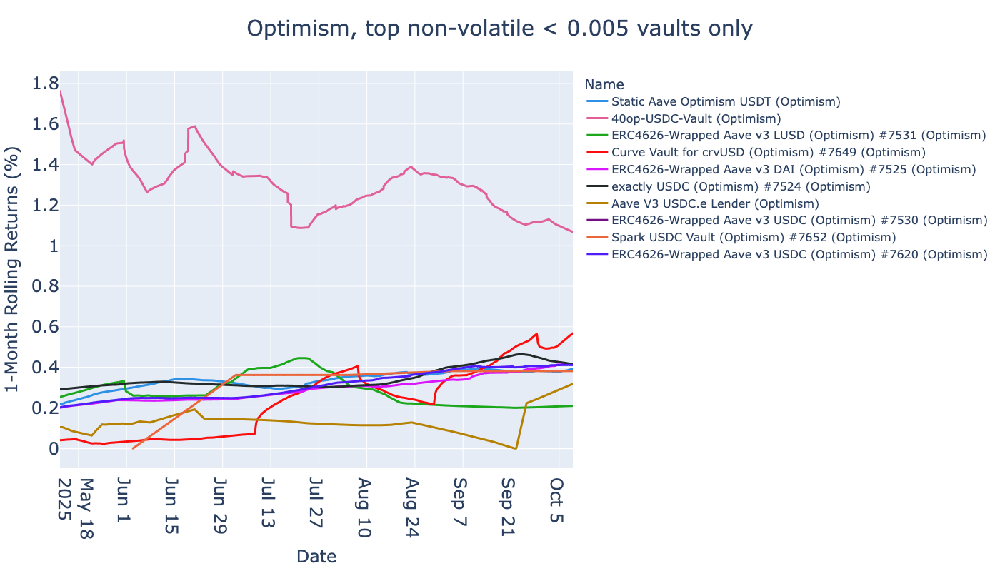

### Polygon

Polygon: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Savings GYD,11.78%,12.87%,2.69%,11.52%,116.0,0.75%,9.93%,0.0001,GYD,"82,376.99","41,321.30",0.92,unknown,unknown,87,<unknown ERC-4626>,137-0xea50f402653c41cadbafd1f788341db7b7f37816,2025-09-09 01:41:06,2025-10-09 00:05:13
Gains Network USDC,22.39%,12.45%,2.42%,10.32%,37.7,0.59%,7.66%,0.0002,USDC,"1,040,663.80","726,345.49",1.72,unknown,unknown,809,Gains Network,137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81,2025-09-09 01:41:06,2025-10-09 00:05:13
Ensuro MSV V2,4.68%,6.09%,1.96%,8.29%,9.0,0.79%,10.45%,0.0006,USDC,"1,821,671.87","384,887.92",0.77,unknown,unknown,"3,278",<unknown ERC-4626>,137-0x14f6dfee761455247c6bf2b2b052a1f6245dd6fb,2025-09-09 01:41:06,2025-10-09 00:05:13
USDC Fluid Lender,0.51%,7.99%,0.51%,7.99%,157.1,0.51%,7.99%,0.0000,USDC,"870,298.81","870,028.81",0.07,unknown,unknown,224,Fluid,137-0xd811a47cfd17355f47ac49be02c4744a926dd16b,2025-09-14 19:30:00,2025-10-09 00:05:13
Compound USDT,2.31%,3.91%,1.48%,6.24%,203.7,0.48%,6.18%,0.0000,USDT0,"17,602,207.70","5,243,885.86",0.59,0.00%,10.00%,"11,287",Morpho,137-0xfd06859a671c21497a2eb8c5e3fea48de924d6c8,2025-09-09 01:41:06,2025-10-09 00:05:13
Bankr USDC Vault,0.47%,5.53%,0.47%,5.53%,155.7,0.46%,5.95%,0.0000,USDC,"719,655.75","718,985.72",0.09,unknown,unknown,314,<unknown ERC-4626>,137-0x5bfd56f9bcbdb2be985c64c620eca7f02fa7b439,2025-09-09 12:20:56,2025-10-09 00:05:13
USDT yVault-A,21.25%,11.06%,1.30%,5.43%,214.6,0.57%,7.42%,0.0000,USDT0,"5,071,722.33","328,531.57",1.84,unknown,unknown,"459,123",Yearn v3,137-0xbb287e6017d3deb0e2e65061e8684eab21060123,2025-09-09 01:41:06,2025-10-09 00:05:13
USDC-1 yVault,11.79%,8.17%,1.13%,4.74%,175.6,0.53%,6.85%,0.0000,USDC,"6,842,261.64","869,633.84",1.42,unknown,unknown,"20,460",Yearn v3,137-0x34b9421fe3d52191b64bc32ec1ab764dcbcdbf5e,2025-09-09 01:41:06,2025-10-09 00:05:13
USDC yVault-A,20.08%,9.83%,1.10%,4.60%,167.4,0.42%,5.39%,0.0000,USDC,"4,392,214.50","203,062.28",1.95,unknown,unknown,"490,749",Yearn v3,137-0xa013fbd4b711f9ded6fb09c1c0d358e2fbc2eaa0,2025-09-09 01:41:06,2025-10-09 00:05:13


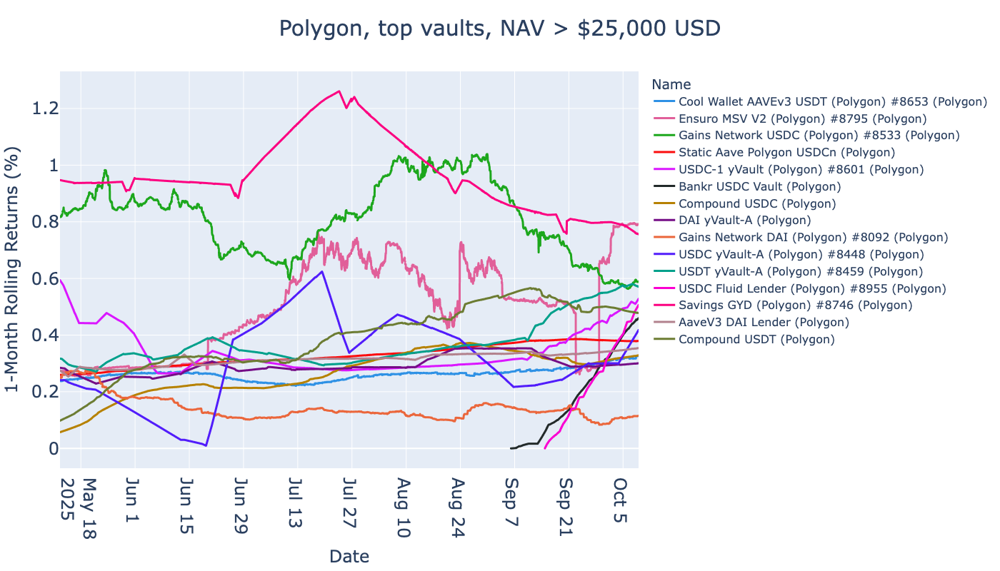

Polygon: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Savings GYD,11.78%,12.87%,2.69%,11.52%,116.0,0.75%,9.93%,0.0001,GYD,"82,376.99","41,321.30",0.92,unknown,unknown,87,<unknown ERC-4626>,137-0xea50f402653c41cadbafd1f788341db7b7f37816,2025-09-09 01:41:06,2025-10-09 00:05:13
Gains Network USDC,22.39%,12.45%,2.42%,10.32%,37.7,0.59%,7.66%,0.0002,USDC,"1,040,663.80","726,345.49",1.72,unknown,unknown,809,Gains Network,137-0x29019fe2e72e8d4d2118e8d0318bef389ffe2c81,2025-09-09 01:41:06,2025-10-09 00:05:13
Ensuro MSV V2,4.68%,6.09%,1.96%,8.29%,9.0,0.79%,10.45%,0.0006,USDC,"1,821,671.87","384,887.92",0.77,unknown,unknown,"3,278",<unknown ERC-4626>,137-0x14f6dfee761455247c6bf2b2b052a1f6245dd6fb,2025-09-09 01:41:06,2025-10-09 00:05:13
USDC Fluid Lender,0.51%,7.99%,0.51%,7.99%,157.1,0.51%,7.99%,0.0000,USDC,"870,298.81","870,028.81",0.07,unknown,unknown,224,Fluid,137-0xd811a47cfd17355f47ac49be02c4744a926dd16b,2025-09-14 19:30:00,2025-10-09 00:05:13
Compound USDT,2.31%,3.91%,1.48%,6.24%,203.7,0.48%,6.18%,0.0000,USDT0,"17,602,207.70","5,243,885.86",0.59,0.00%,10.00%,"11,287",Morpho,137-0xfd06859a671c21497a2eb8c5e3fea48de924d6c8,2025-09-09 01:41:06,2025-10-09 00:05:13
Bankr USDC Vault,0.47%,5.53%,0.47%,5.53%,155.7,0.46%,5.95%,0.0000,USDC,"719,655.75","718,985.72",0.09,unknown,unknown,314,<unknown ERC-4626>,137-0x5bfd56f9bcbdb2be985c64c620eca7f02fa7b439,2025-09-09 12:20:56,2025-10-09 00:05:13
USDT yVault-A,21.25%,11.06%,1.30%,5.43%,214.6,0.57%,7.42%,0.0000,USDT0,"5,071,722.33","328,531.57",1.84,unknown,unknown,"459,123",Yearn v3,137-0xbb287e6017d3deb0e2e65061e8684eab21060123,2025-09-09 01:41:06,2025-10-09 00:05:13
USDC-1 yVault,11.79%,8.17%,1.13%,4.74%,175.6,0.53%,6.85%,0.0000,USDC,"6,842,261.64","869,633.84",1.42,unknown,unknown,"20,460",Yearn v3,137-0x34b9421fe3d52191b64bc32ec1ab764dcbcdbf5e,2025-09-09 01:41:06,2025-10-09 00:05:13
USDC yVault-A,20.08%,9.83%,1.10%,4.60%,167.4,0.42%,5.39%,0.0000,USDC,"4,392,214.50","203,062.28",1.95,unknown,unknown,"490,749",Yearn v3,137-0xa013fbd4b711f9ded6fb09c1c0d358e2fbc2eaa0,2025-09-09 01:41:06,2025-10-09 00:05:13


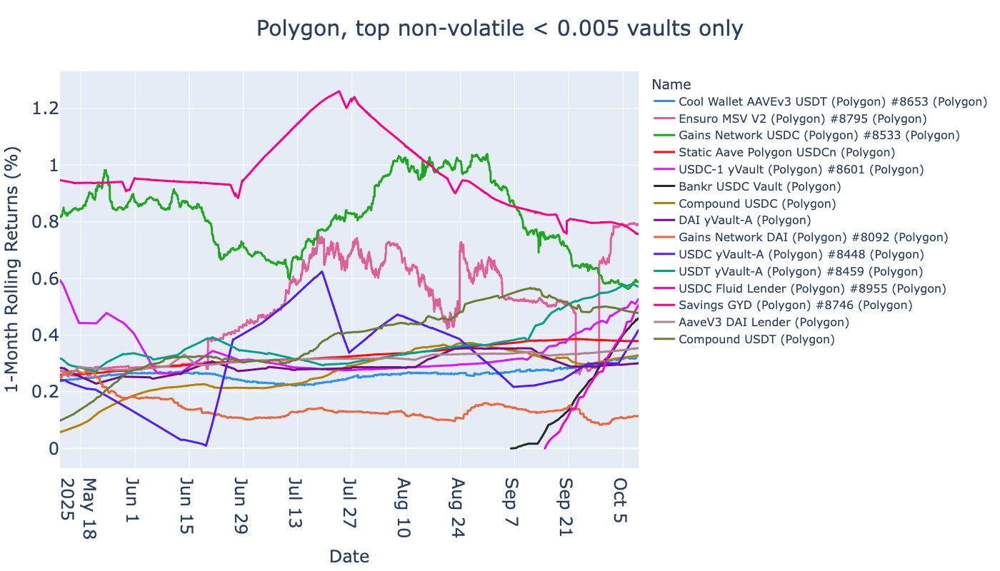

### Hyperliquid

Hyperliquid: Displaying top 15 vaults based on three months returns, total 12 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
hyUSDXL (Purr) - 2,6.74%,14.31%,4.08%,18.06%,124.9,1.20%,16.79%,0.0008,USDXL,"281,873.14","126,089.26",0.49,unknown,unknown,"1,280",<unknown ERC-4626>,999-0x8001e1e7b05990d22dd8cdb9737f9fe6589827ce,2025-09-09 12:45:25,2025-10-07 19:30:43
hyUSDXL (Looped HYPE) - 1,5.39%,11.11%,2.92%,12.68%,114.6,0.56%,7.52%,0.0006,USDXL,"3,118,200.08","1,057,064.59",0.50,unknown,unknown,"3,557",<unknown ERC-4626>,999-0xaeedd5b6d42e0f077ccf3e7a78ff70b8cb217329,2025-09-09 12:45:25,2025-10-07 19:30:43
hyUSDXL (HFUN) - 3,4.08%,9.61%,2.77%,11.99%,102.5,1.00%,13.85%,0.0006,USDXL,"105,079.74","40,600.97",0.44,unknown,unknown,240,<unknown ERC-4626>,999-0xdc87120ddfc236db5e48e8e0fee0c4b8c323b64b,2025-09-09 12:45:25,2025-10-07 19:30:43
Gauntlet USDe Core,3.41%,8.70%,2.76%,11.94%,194.3,0.96%,13.21%,0.0003,USDe,"1,331,243.27","483,617.22",0.40,0.00%,10.00%,"3,973",Morpho,999-0x5eec795d919fa97688fb9844eeb0072e6b846f9d,2025-09-09 12:45:25,2025-10-07 19:30:43
Felix USDe,4.07%,9.99%,2.65%,11.46%,278.6,0.83%,11.40%,0.0002,USDe,"25,603,633.56","10,052,810.53",0.42,0.00%,10.00%,"13,813",Morpho,999-0x835febf893c6dddee5cf762b0f8e31c5b06938ab,2025-09-09 12:45:25,2025-10-07 19:30:43
Felix USDC,0.44%,8.43%,0.44%,8.43%,155.9,0.44%,8.43%,0.0003,USDC,"16,839,919.34","16,839,919.34",0.05,0.00%,0.00%,747,Morpho,999-0x8a862fd6c12f9ad34c9c2ff45ab2b6712e8cea27,2025-09-16 21:49:35,2025-10-07 19:30:43
Hyperdrive Primary USDe Market,2.62%,6.38%,1.90%,8.12%,153.1,0.52%,6.97%,0.0003,USDe,"2,527,723.05","313,218.82",0.42,unknown,unknown,"4,721",<unknown ERC-7540>,999-0x167101b7994c1c206b5a20a401b1f771edbe988f,2025-09-09 12:45:25,2025-10-07 19:30:43
MEV Capital USR,1.54%,7.64%,1.54%,7.64%,206.7,0.50%,6.66%,0.0002,USR,"12,921,807.15","4,174,618.82",0.21,0.00%,10.00%,"1,960",Morpho,999-0xd3a9cb7312b9c29113290758f5adfe12304cd16a,2025-09-09 12:45:25,2025-10-07 19:30:43
Hyperdrive USDe Liquidator,1.80%,4.35%,1.61%,6.87%,7.4,1.39%,19.66%,0.0053,USDe,"100,103.80","50,641.04",0.42,unknown,unknown,228,<unknown ERC-4626>,999-0xaeaad6d9b096829e5f3804a747c9fdd6677d78f0,2025-09-09 12:45:25,2025-10-07 19:30:43


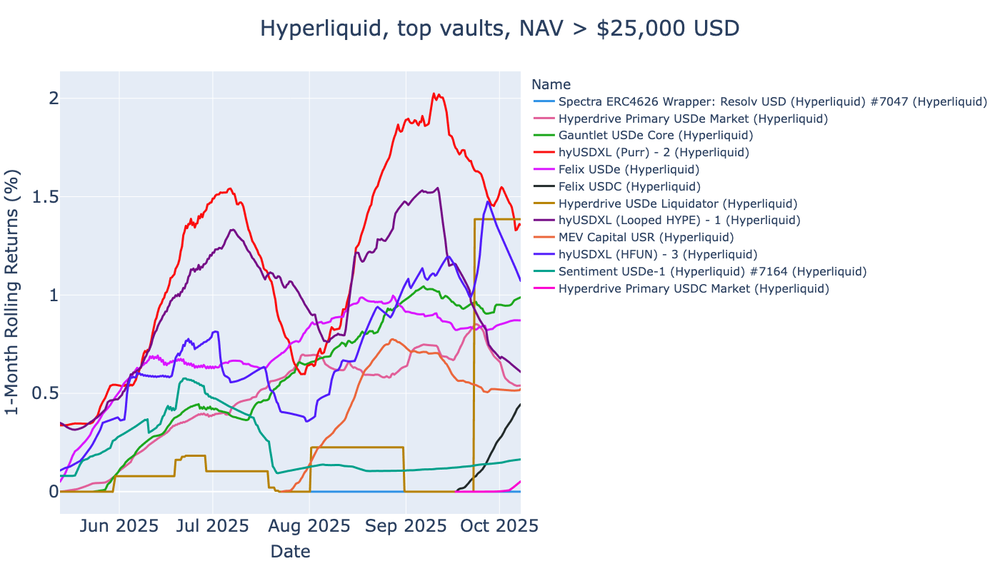

Hyperliquid: Displaying top 15 non-volatile vaults based on three months returns, total 12 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
hyUSDXL (Purr) - 2,6.74%,14.31%,4.08%,18.06%,124.9,1.20%,16.79%,0.0008,USDXL,"281,873.14","126,089.26",0.49,unknown,unknown,"1,280",<unknown ERC-4626>,999-0x8001e1e7b05990d22dd8cdb9737f9fe6589827ce,2025-09-09 12:45:25,2025-10-07 19:30:43
hyUSDXL (Looped HYPE) - 1,5.39%,11.11%,2.92%,12.68%,114.6,0.56%,7.52%,0.0006,USDXL,"3,118,200.08","1,057,064.59",0.50,unknown,unknown,"3,557",<unknown ERC-4626>,999-0xaeedd5b6d42e0f077ccf3e7a78ff70b8cb217329,2025-09-09 12:45:25,2025-10-07 19:30:43
hyUSDXL (HFUN) - 3,4.08%,9.61%,2.77%,11.99%,102.5,1.00%,13.85%,0.0006,USDXL,"105,079.74","40,600.97",0.44,unknown,unknown,240,<unknown ERC-4626>,999-0xdc87120ddfc236db5e48e8e0fee0c4b8c323b64b,2025-09-09 12:45:25,2025-10-07 19:30:43
Gauntlet USDe Core,3.41%,8.70%,2.76%,11.94%,194.3,0.96%,13.21%,0.0003,USDe,"1,331,243.27","483,617.22",0.40,0.00%,10.00%,"3,973",Morpho,999-0x5eec795d919fa97688fb9844eeb0072e6b846f9d,2025-09-09 12:45:25,2025-10-07 19:30:43
Felix USDe,4.07%,9.99%,2.65%,11.46%,278.6,0.83%,11.40%,0.0002,USDe,"25,603,633.56","10,052,810.53",0.42,0.00%,10.00%,"13,813",Morpho,999-0x835febf893c6dddee5cf762b0f8e31c5b06938ab,2025-09-09 12:45:25,2025-10-07 19:30:43
Felix USDC,0.44%,8.43%,0.44%,8.43%,155.9,0.44%,8.43%,0.0003,USDC,"16,839,919.34","16,839,919.34",0.05,0.00%,0.00%,747,Morpho,999-0x8a862fd6c12f9ad34c9c2ff45ab2b6712e8cea27,2025-09-16 21:49:35,2025-10-07 19:30:43
Hyperdrive Primary USDe Market,2.62%,6.38%,1.90%,8.12%,153.1,0.52%,6.97%,0.0003,USDe,"2,527,723.05","313,218.82",0.42,unknown,unknown,"4,721",<unknown ERC-7540>,999-0x167101b7994c1c206b5a20a401b1f771edbe988f,2025-09-09 12:45:25,2025-10-07 19:30:43
MEV Capital USR,1.54%,7.64%,1.54%,7.64%,206.7,0.50%,6.66%,0.0002,USR,"12,921,807.15","4,174,618.82",0.21,0.00%,10.00%,"1,960",Morpho,999-0xd3a9cb7312b9c29113290758f5adfe12304cd16a,2025-09-09 12:45:25,2025-10-07 19:30:43
Sentiment USDe-1,1.20%,2.92%,0.41%,1.71%,225.0,0.16%,2.07%,0.0000,USDe,"884,470.34","459,871.21",0.41,unknown,unknown,"1,229",<unknown ERC-4626>,999-0xe45e7272da7208c7a137505dfb9491e330bf1a4e,2025-09-09 12:45:25,2025-10-07 19:30:43


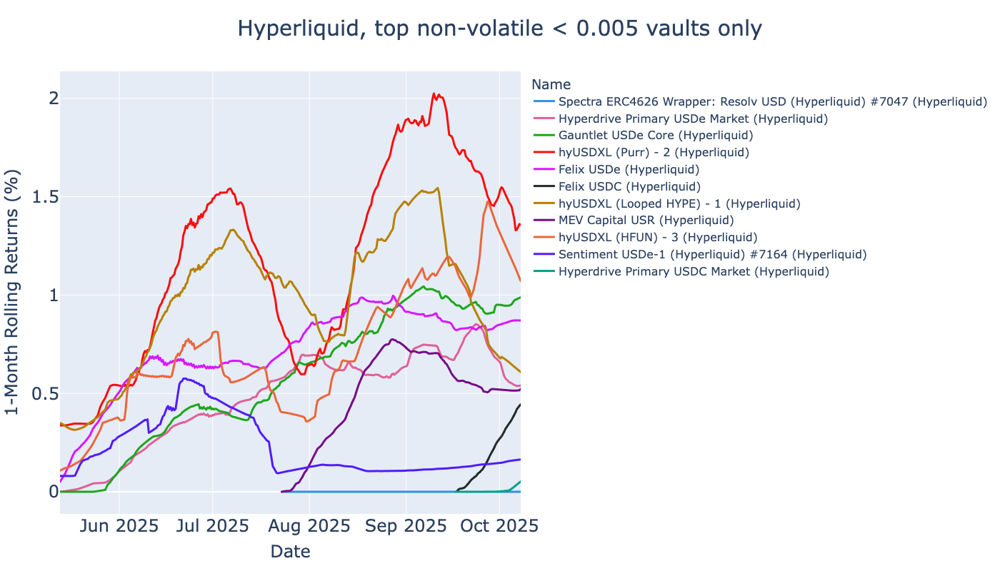

### Berachain

Berachain: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
MEV Capital USDC.e,1.57%,4.95%,0.08%,10.03%,112.7,0.00%,0.00%,0.0001,USDC.e,"7,067,846.59","98,635.84",0.32,unknown,unknown,"3,057",Euler Vault Kit,80094-0x1371dd58ce95ecd624340f072f97212a2661a280,2025-07-11 01:30:55,2025-07-14 13:48:29
Dolomite: USDC.e,3.00%,4.41%,1.66%,6.98%,130.3,0.54%,7.03%,0.0001,USDC.e,"60,217,639.39","4,370,885.84",0.68,unknown,unknown,"3,165",<unknown ERC-4626>,80094-0x444868b6e8079ac2c55eea115250f92c2b2c4d14,2025-09-09 02:07:12,2025-10-09 00:07:11
Dolomite: BYUSD,0.37%,5.84%,0.37%,5.84%,184.7,0.37%,5.84%,0.0000,BYUSD,"37,502,917.29","2,742,109.52",0.07,unknown,unknown,594,<unknown ERC-4626>,80094-0x2948609cdd0ac4110b63165be9d4aade66bf40f6,2025-09-14 20:07:11,2025-10-09 00:07:11
Concrete USDe MultiSig Strategy,1.95%,4.65%,1.31%,5.47%,9.1,0.60%,7.89%,0.0007,USDe,"6,376,098.45","1,699,376.86",0.42,unknown,unknown,812,<unknown ERC-4626>,80094-0x4ab370bb847fcc1d742d792f1bf2aff458af7c61,2025-09-09 02:07:12,2025-10-09 00:07:11
Dolomite: USDe,3.28%,4.90%,1.28%,5.37%,159.1,0.47%,6.03%,0.0000,USDe,"30,689,121.66","1,670,377.90",0.67,unknown,unknown,"2,254",<unknown ERC-4626>,80094-0xd628b5abd6829896134ffdaeea8393dc531a1efd,2025-09-09 02:07:12,2025-10-09 00:07:11
Concrete-BeraUSDe-Vault,1.37%,3.25%,0.93%,3.88%,6.5,0.48%,6.21%,0.0007,USDe,"6,376,098.45","1,699,376.86",0.42,unknown,unknown,834,<unknown ERC-4626>,80094-0x585934afbf1fa9f563b80283f8b916dd8f66a9b6,2025-09-09 02:07:12,2025-10-09 00:07:11
HyperBERA.USDC,1.93%,2.90%,0.82%,3.41%,2.8,0.00%,0.00%,0.0014,USDC.e,"10,000,000.00","236,660.11",0.67,unknown,unknown,941,<unknown ERC-4626>,80094-0x36b933554782b108bb9962ac00c498acbceb706d,2025-09-09 02:07:12,2025-10-09 00:07:11
Tulipa Hive USDC,1.46%,2.61%,0.70%,2.91%,118.7,0.27%,3.48%,0.0000,USDC.e,"5,492,442.02","237,552.39",0.56,unknown,unknown,"3,659",Euler Vault Kit,80094-0xe932da5a4d00536c224f8153f299cdcd8054c444,2025-09-09 02:07:12,2025-10-09 00:07:11
Concrete-USDe-Vault,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDe,"72,114,721.05","13,441,206.33",0.67,unknown,unknown,"4,611",<unknown ERC-4626>,80094-0x59e24f42cae1b82c8b2dc79ea898f2f8b4986dfc,2025-09-09 02:07:12,2025-10-09 00:07:11


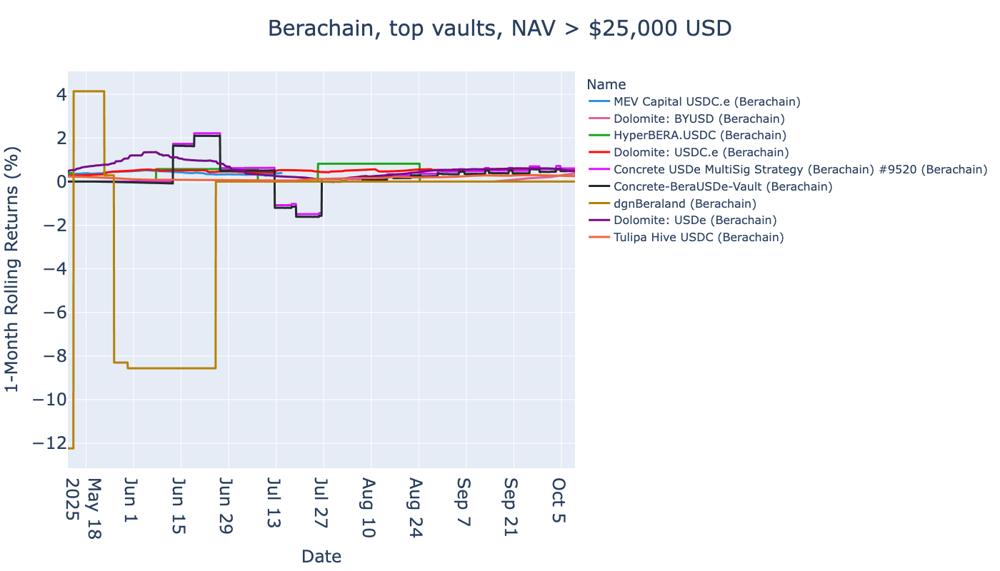

Berachain: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
MEV Capital USDC.e,1.57%,4.95%,0.08%,10.03%,112.7,0.00%,0.00%,0.0001,USDC.e,"7,067,846.59","98,635.84",0.32,unknown,unknown,"3,057",Euler Vault Kit,80094-0x1371dd58ce95ecd624340f072f97212a2661a280,2025-07-11 01:30:55,2025-07-14 13:48:29
Dolomite: USDC.e,3.00%,4.41%,1.66%,6.98%,130.3,0.54%,7.03%,0.0001,USDC.e,"60,217,639.39","4,370,885.84",0.68,unknown,unknown,"3,165",<unknown ERC-4626>,80094-0x444868b6e8079ac2c55eea115250f92c2b2c4d14,2025-09-09 02:07:12,2025-10-09 00:07:11
Dolomite: BYUSD,0.37%,5.84%,0.37%,5.84%,184.7,0.37%,5.84%,0.0000,BYUSD,"37,502,917.29","2,742,109.52",0.07,unknown,unknown,594,<unknown ERC-4626>,80094-0x2948609cdd0ac4110b63165be9d4aade66bf40f6,2025-09-14 20:07:11,2025-10-09 00:07:11
Concrete USDe MultiSig Strategy,1.95%,4.65%,1.31%,5.47%,9.1,0.60%,7.89%,0.0007,USDe,"6,376,098.45","1,699,376.86",0.42,unknown,unknown,812,<unknown ERC-4626>,80094-0x4ab370bb847fcc1d742d792f1bf2aff458af7c61,2025-09-09 02:07:12,2025-10-09 00:07:11
Dolomite: USDe,3.28%,4.90%,1.28%,5.37%,159.1,0.47%,6.03%,0.0000,USDe,"30,689,121.66","1,670,377.90",0.67,unknown,unknown,"2,254",<unknown ERC-4626>,80094-0xd628b5abd6829896134ffdaeea8393dc531a1efd,2025-09-09 02:07:12,2025-10-09 00:07:11
Concrete-BeraUSDe-Vault,1.37%,3.25%,0.93%,3.88%,6.5,0.48%,6.21%,0.0007,USDe,"6,376,098.45","1,699,376.86",0.42,unknown,unknown,834,<unknown ERC-4626>,80094-0x585934afbf1fa9f563b80283f8b916dd8f66a9b6,2025-09-09 02:07:12,2025-10-09 00:07:11
HyperBERA.USDC,1.93%,2.90%,0.82%,3.41%,2.8,0.00%,0.00%,0.0014,USDC.e,"10,000,000.00","236,660.11",0.67,unknown,unknown,941,<unknown ERC-4626>,80094-0x36b933554782b108bb9962ac00c498acbceb706d,2025-09-09 02:07:12,2025-10-09 00:07:11
Tulipa Hive USDC,1.46%,2.61%,0.70%,2.91%,118.7,0.27%,3.48%,0.0000,USDC.e,"5,492,442.02","237,552.39",0.56,unknown,unknown,"3,659",Euler Vault Kit,80094-0xe932da5a4d00536c224f8153f299cdcd8054c444,2025-09-09 02:07:12,2025-10-09 00:07:11
Concrete-USDe-Vault,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDe,"72,114,721.05","13,441,206.33",0.67,unknown,unknown,"4,611",<unknown ERC-4626>,80094-0x59e24f42cae1b82c8b2dc79ea898f2f8b4986dfc,2025-09-09 02:07:12,2025-10-09 00:07:11


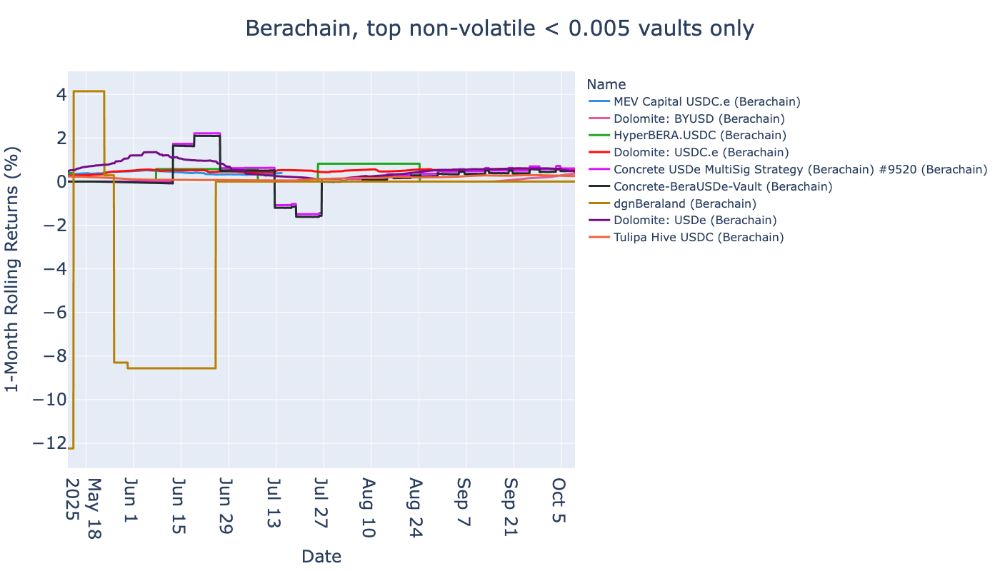

### Sonic

Sonic: Displaying top 15 vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 38,5.53%,36.61%,5.53%,36.61%,74.8,3.57%,55.50%,0.0002,USDC,"142,910.19","119,899.88",0.17,unknown,unknown,491,Peapods,146-0x87caed1e19da46098e710b69cae33e74c146bacd,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 5,13.94%,26.61%,7.75%,35.84%,138.9,3.75%,59.03%,0.0001,USDC,"148,662.53","78,104.23",0.55,unknown,unknown,"3,819",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 8,15.38%,29.52%,7.08%,32.39%,122.3,2.98%,44.75%,0.0001,USDC,"46,198.38","32,433.63",0.55,unknown,unknown,"2,218",Peapods,146-0x4f5f42f69f4804b9a88fc5fa94dbabd8903e6d03,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC - 37,5.90%,29.93%,5.90%,29.93%,103.7,3.38%,51.92%,0.0001,USDC,"38,707.14","37,326.45",0.22,unknown,unknown,182,Peapods,146-0xf76b40c9ede382a279089a68372b94e9df06ade4,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 24,15.76%,34.14%,5.69%,25.52%,192.9,2.13%,30.43%,0.0000,USDC,"867,540.65","92,164.28",0.50,unknown,unknown,"1,742",Peapods,146-0xd8bfa0e4162d1ec511e36cf7911c02e7956ea0e7,2025-09-09 01:32:39,2025-10-09 00:03:16
Staked msUSD,6.47%,20.65%,5.05%,22.39%,15.5,1.67%,23.24%,0.0005,msUSD,"6,527,893.63","6,527,893.63",0.33,unknown,unknown,"1,866",<unknown ERC-4626>,146-0xc7990369da608c2f4903715e3bd22f2970536c29,2025-09-09 01:32:39,2025-10-09 00:03:16
YieldFi yUSD,0.05%,19.22%,0.05%,19.22%,99.1,0.05%,19.22%,0.0000,USDC,"458,504.01","457,111.13",0.00,unknown,unknown,473,<unknown ERC-4626>,146-0x4772d2e014f9fc3a820c444e3313968e9a5c8121,2025-10-07 03:14:22,2025-10-09 00:03:16
EVK Vault eUSDC-1,2.86%,14.53%,2.86%,14.53%,129.7,1.58%,21.79%,0.0000,USDC,"444,226.46","263,660.07",0.21,unknown,unknown,536,Euler Vault Kit,146-0x9ccf74e64922d8a48b87aa4200b7c27b2b1d860a,2025-09-09 01:32:39,2025-10-09 00:03:16
"Silo Finance Borrowable USDC Deposit, SiloId: 23",6.30%,9.34%,3.30%,14.27%,9.7,0.76%,9.98%,0.0005,USDC,"12,056,734.18","491,336.74",0.68,unknown,unknown,"69,679",<unknown ERC-4626>,146-0x5954ce6671d97d24b782920ddcdbb4b1e63ab2de,2025-09-09 01:32:39,2025-10-09 00:03:16


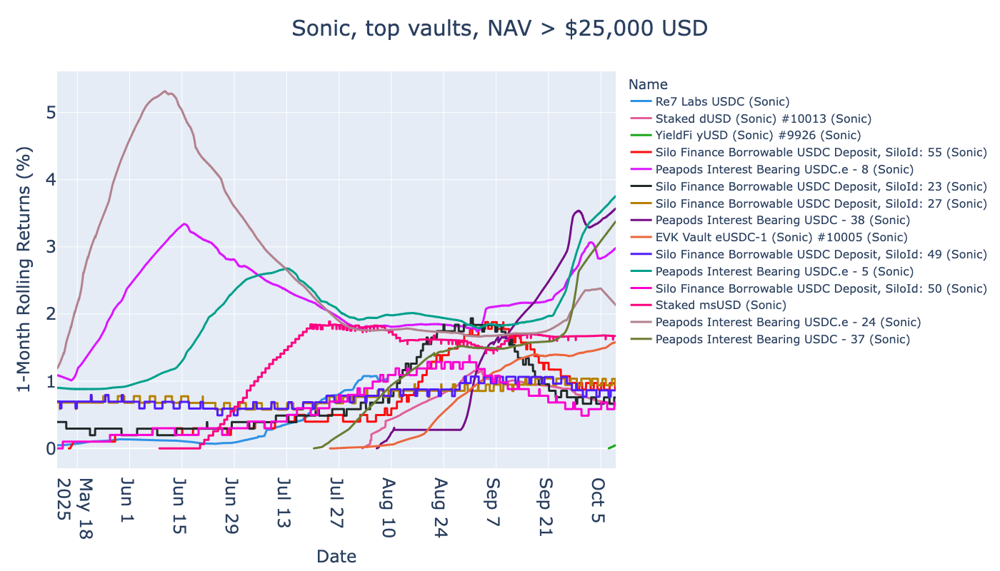

Sonic: Displaying top 15 non-volatile vaults based on three months returns, total 15 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Peapods Interest Bearing USDC - 38,5.53%,36.61%,5.53%,36.61%,74.8,3.57%,55.50%,0.0002,USDC,"142,910.19","119,899.88",0.17,unknown,unknown,491,Peapods,146-0x87caed1e19da46098e710b69cae33e74c146bacd,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 5,13.94%,26.61%,7.75%,35.84%,138.9,3.75%,59.03%,0.0001,USDC,"148,662.53","78,104.23",0.55,unknown,unknown,"3,819",Peapods,146-0xaa21d270c1f67ce648b129e8e5921e702eff4d2f,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 8,15.38%,29.52%,7.08%,32.39%,122.3,2.98%,44.75%,0.0001,USDC,"46,198.38","32,433.63",0.55,unknown,unknown,"2,218",Peapods,146-0x4f5f42f69f4804b9a88fc5fa94dbabd8903e6d03,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC - 37,5.90%,29.93%,5.90%,29.93%,103.7,3.38%,51.92%,0.0001,USDC,"38,707.14","37,326.45",0.22,unknown,unknown,182,Peapods,146-0xf76b40c9ede382a279089a68372b94e9df06ade4,2025-09-09 01:32:39,2025-10-09 00:03:16
Peapods Interest Bearing USDC.e - 24,15.76%,34.14%,5.69%,25.52%,192.9,2.13%,30.43%,0.0000,USDC,"867,540.65","92,164.28",0.50,unknown,unknown,"1,742",Peapods,146-0xd8bfa0e4162d1ec511e36cf7911c02e7956ea0e7,2025-09-09 01:32:39,2025-10-09 00:03:16
Staked msUSD,6.47%,20.65%,5.05%,22.39%,15.5,1.67%,23.24%,0.0005,msUSD,"6,527,893.63","6,527,893.63",0.33,unknown,unknown,"1,866",<unknown ERC-4626>,146-0xc7990369da608c2f4903715e3bd22f2970536c29,2025-09-09 01:32:39,2025-10-09 00:03:16
YieldFi yUSD,0.05%,19.22%,0.05%,19.22%,99.1,0.05%,19.22%,0.0000,USDC,"458,504.01","457,111.13",0.00,unknown,unknown,473,<unknown ERC-4626>,146-0x4772d2e014f9fc3a820c444e3313968e9a5c8121,2025-10-07 03:14:22,2025-10-09 00:03:16
EVK Vault eUSDC-1,2.86%,14.53%,2.86%,14.53%,129.7,1.58%,21.79%,0.0000,USDC,"444,226.46","263,660.07",0.21,unknown,unknown,536,Euler Vault Kit,146-0x9ccf74e64922d8a48b87aa4200b7c27b2b1d860a,2025-09-09 01:32:39,2025-10-09 00:03:16
"Silo Finance Borrowable USDC Deposit, SiloId: 23",6.30%,9.34%,3.30%,14.27%,9.7,0.76%,9.98%,0.0005,USDC,"12,056,734.18","491,336.74",0.68,unknown,unknown,"69,679",<unknown ERC-4626>,146-0x5954ce6671d97d24b782920ddcdbb4b1e63ab2de,2025-09-09 01:32:39,2025-10-09 00:03:16


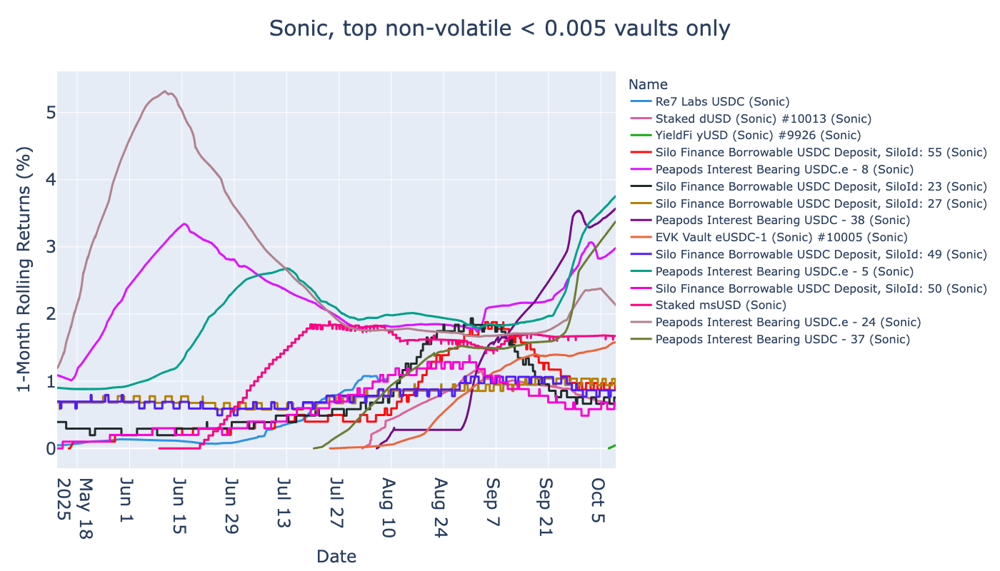

### Blast

Blast: Displaying top 15 vaults based on three months returns, total 4 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Hyper USDB,10.22%,6.55%,0.46%,1.92%,51.7,0.13%,1.70%,0.0000,USDB,"5,140,896.63","353,891.02",1.53,unknown,unknown,"40,501",<unknown ERC-4626>,81457-0x390b781baf1e6db546cf4e3354b81446947838d2,2025-09-09 01:15:37,2025-10-09 00:15:37
ybUSDB,11.03%,6.74%,0.46%,1.92%,51.7,0.13%,1.70%,0.0000,USDB,"1,754,382.16","72,692.20",1.60,unknown,unknown,"22,137",<unknown ERC-4626>,81457-0xcd732d21c1b23a3f84bb386e9759b5b6a1bcbe39,2025-09-09 01:15:37,2025-10-09 00:15:37
Wasabi USDB Vault,14.80%,11.80%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDB,"55,061,771.12","1,052,027.22",1.24,unknown,unknown,"93,772",<unknown ERC-4626>,81457-0x4bed2a922654cacc2be974689619768fabf24855,2024-03-05 15:15:37,2025-06-01 03:15:37
Vault Tranche USDB,-5.09%,-14.48%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDB,"14,295,489.79","259,436.43",0.33,unknown,unknown,"43,028",<unknown ERC-4626>,81457-0xdb0c5d39c95a53ecda3fcf6f6c5c81c7a74910c7,2024-03-09 10:15:37,2024-07-09 11:15:37


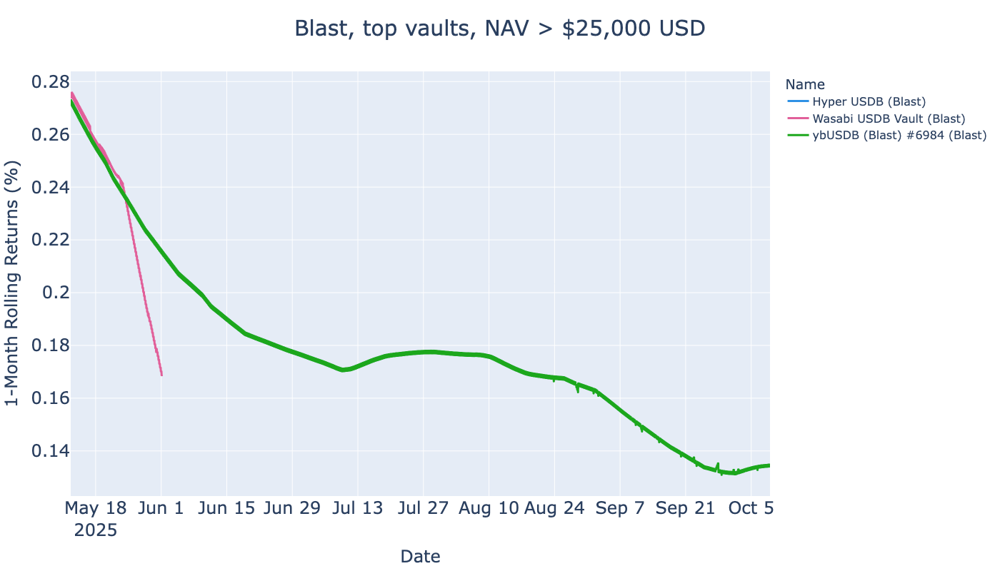

Blast: Displaying top 15 non-volatile vaults based on three months returns, total 4 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
Hyper USDB,10.22%,6.55%,0.46%,1.92%,51.7,0.13%,1.70%,0.0000,USDB,"5,140,896.63","353,891.02",1.53,unknown,unknown,"40,501",<unknown ERC-4626>,81457-0x390b781baf1e6db546cf4e3354b81446947838d2,2025-09-09 01:15:37,2025-10-09 00:15:37
ybUSDB,11.03%,6.74%,0.46%,1.92%,51.7,0.13%,1.70%,0.0000,USDB,"1,754,382.16","72,692.20",1.60,unknown,unknown,"22,137",<unknown ERC-4626>,81457-0xcd732d21c1b23a3f84bb386e9759b5b6a1bcbe39,2025-09-09 01:15:37,2025-10-09 00:15:37
Wasabi USDB Vault,14.80%,11.80%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDB,"55,061,771.12","1,052,027.22",1.24,unknown,unknown,"93,772",<unknown ERC-4626>,81457-0x4bed2a922654cacc2be974689619768fabf24855,2024-03-05 15:15:37,2025-06-01 03:15:37
Vault Tranche USDB,-5.09%,-14.48%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDB,"14,295,489.79","259,436.43",0.33,unknown,unknown,"43,028",<unknown ERC-4626>,81457-0xdb0c5d39c95a53ecda3fcf6f6c5c81c7a74910c7,2024-03-09 10:15:37,2024-07-09 11:15:37


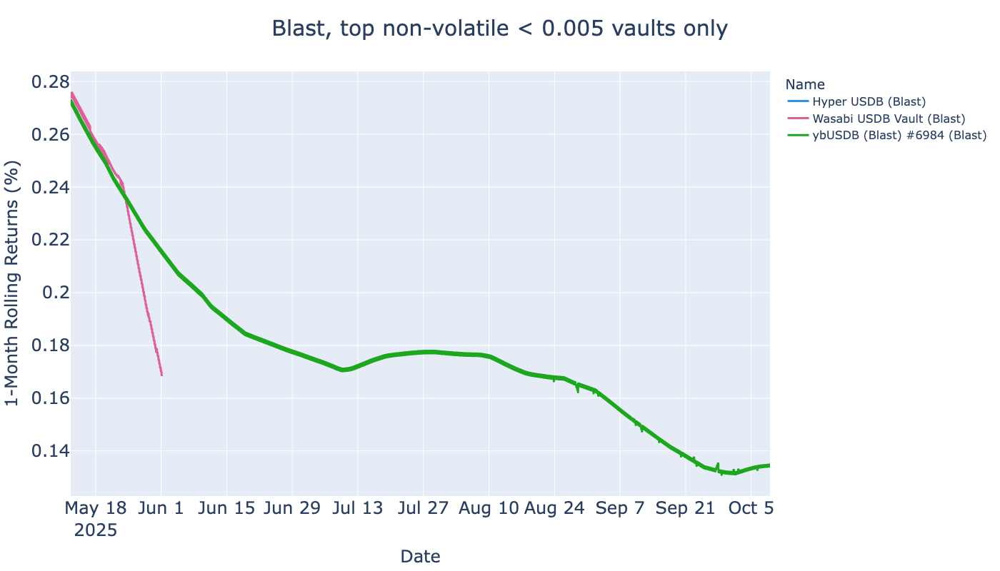

### Soneium

Soneium: Displaying top 15 vaults based on three months returns, total 1 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
UB-USDC,0.00%,0.00%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDC.e,"403,575.79","402,590.81",0.01,unknown,unknown,"295,560",<unknown ERC-4626>,1868-0xc675bb95d73ca7db2c09c3dc04daaa7944ccba41,2025-01-13 06:52:11,2025-01-17 07:52:11


Nothing to display
Soneium: Displaying top 15 non-volatile vaults based on three months returns, total 1 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
UB-USDC,0.00%,0.00%,0.00%,0.00%,0.0,0.00%,0.00%,0.0000,USDC.e,"403,575.79","402,590.81",0.01,unknown,unknown,"295,560",<unknown ERC-4626>,1868-0xc675bb95d73ca7db2c09c3dc04daaa7944ccba41,2025-01-13 06:52:11,2025-01-17 07:52:11


Nothing to display


### ZKsync

ZKsync: Displaying top 15 vaults based on three months returns, total 1 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
hsUSDC,17.35%,6.93%,-0.09%,-0.35%,-0.8,0.12%,1.47%,0.0008,USDC.e,"4,052,373.78","356,615.19",2.39,unknown,unknown,"48,875",Gains Network,324-0xaf08a9d918f16332f22cf8dc9abe9d9e14ddcbc2,2025-09-09 02:24:25,2025-10-08 20:58:10


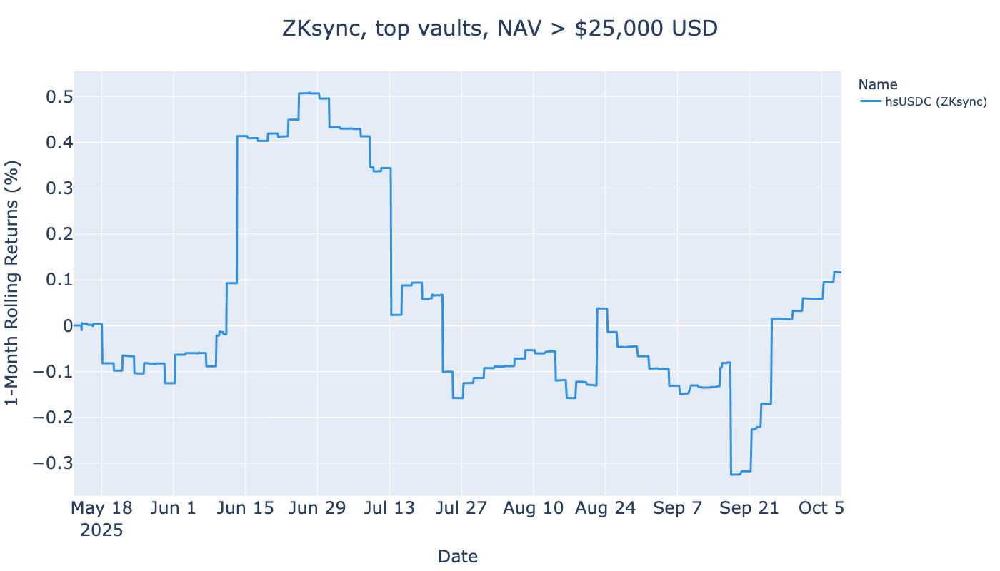

ZKsync: Displaying top 15 non-volatile vaults based on three months returns, total 1 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
hsUSDC,17.35%,6.93%,-0.09%,-0.35%,-0.8,0.12%,1.47%,0.0008,USDC.e,"4,052,373.78","356,615.19",2.39,unknown,unknown,"48,875",Gains Network,324-0xaf08a9d918f16332f22cf8dc9abe9d9e14ddcbc2,2025-09-09 02:24:25,2025-10-08 20:58:10


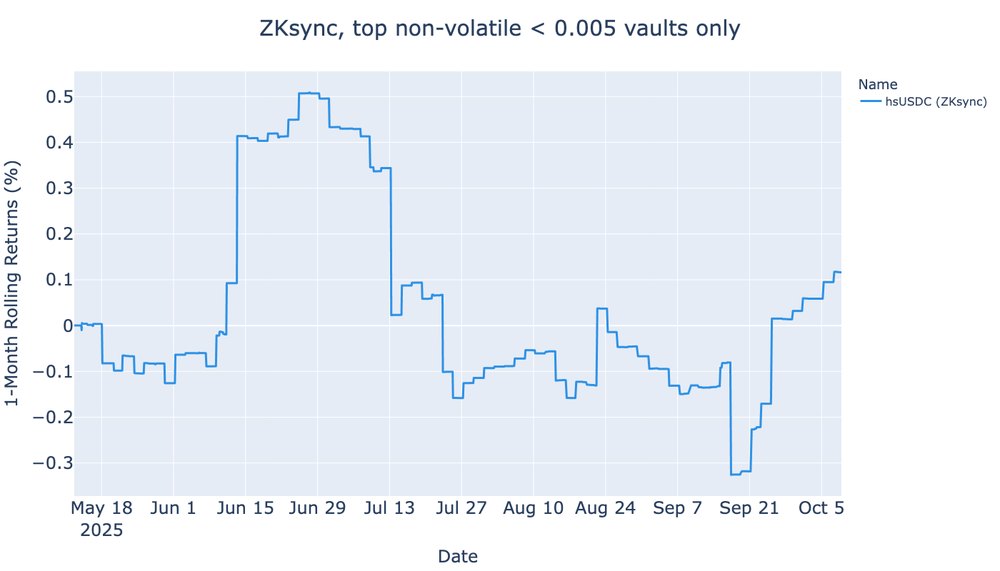

### Mode

Mode: Displaying top 15 vaults based on three months returns, total 2 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USDC Ironclad Vault,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDC,"599,478.47","337,647.27",1.14,unknown,unknown,183,<unknown ERC-4626>,34443-0x882fd369341fc435ad5e54e91d1ebc23b1fc6d4c,2025-09-09 00:58:43,2025-10-08 23:58:43
USDT Ironclad Vault,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDT,"148,365.55","111,020.54",1.14,unknown,unknown,31,<unknown ERC-4626>,34443-0xc9cfb5221ee50098bd8882727522301a62c7b021,2025-09-09 00:58:43,2025-10-08 23:58:43


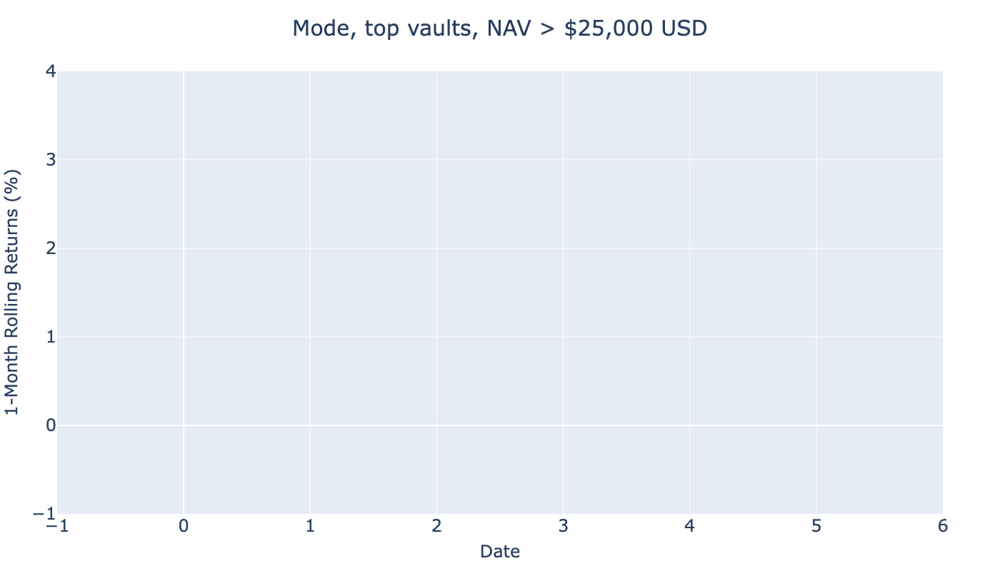

Mode: Displaying top 15 non-volatile vaults based on three months returns, total 2 interesting vaults on this chain


,Lifetime return,Lifetime return ann.,3M return,3M return ann.,3M sharpe,1M return,1M return ann.,3M volatility,Denomination,Peak TVL USD,Current TVL USD,Age (years),Management fee,Performance fee,Deposit/redeem count,Protocol,id,First deposit,Last deposit
Name,,,,,,,,,,,,,,,,,,,
USDC Ironclad Vault,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDC,"599,478.47","337,647.27",1.14,unknown,unknown,183,<unknown ERC-4626>,34443-0x882fd369341fc435ad5e54e91d1ebc23b1fc6d4c,2025-09-09 00:58:43,2025-10-08 23:58:43
USDT Ironclad Vault,0.00%,0.00%,0.00%,0.00%,nan,0.00%,0.00%,0.0000,USDT,"148,365.55","111,020.54",1.14,unknown,unknown,31,<unknown ERC-4626>,34443-0xc9cfb5221ee50098bd8882727522301a62c7b021,2025-09-09 00:58:43,2025-10-08 23:58:43


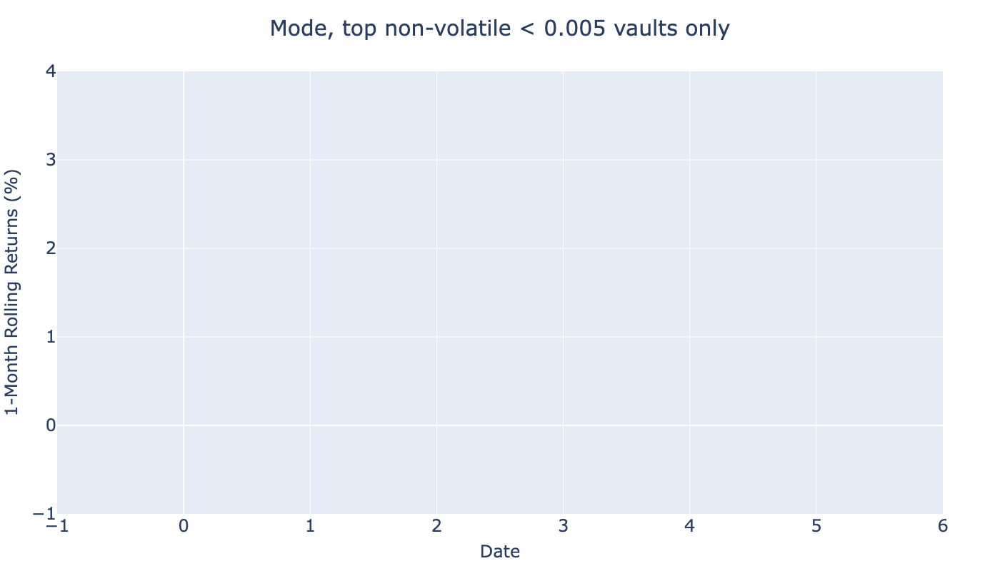

### Mantle

Mantle: Displaying top 15 vaults based on three months returns, total 0 interesting vaults on this chain
Nothing to display
Mantle: Displaying top 15 non-volatile vaults based on three months returns, total 0 interesting vaults on this chain
Nothing to display


In [16]:
from IPython.display import Markdown

from eth_defi.research.rolling_returns import calculate_rolling_returns
from eth_defi.research.rolling_returns import visualise_rolling_returns

benchmark_count = 15
min_nav = 25_000
volatility_threshold = 0.005

def _draw_chain_top_vaults_chart(interesting_vaults: pd.Series, title: str):
    """Draw 1 months return chart for specific vaults"""

    if len(interesting_vaults) > 0:
        rolling_returns_df = calculate_rolling_returns(
            returns_df,
            interesting_vaults=interesting_vaults,
            clip_up=50,
            clip_down=-50,
        )
        if len(rolling_returns_df) > 2:
            fig = visualise_rolling_returns(rolling_returns_df, title=title)
            fig.show()
            return

    print("Nothing to display")


chains = lifetime_data_df["chain"].unique()
print(f"Doing chain breakdown for chains: {list(chains)}")

# Do 2 charts per chain
for chain_name in chains:
    display(Markdown(f"### {chain_name}"))

    # chain_df = df[df["chain"] == chain_id]
    lifetime_data_filtered_df = lifetime_data_df[lifetime_data_df["chain"] == chain_name]

    lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["current_nav"] >= min_nav]
    lifetime_data_filtered_df = lifetime_data_filtered_df.sort_values(by="three_months_cagr", ascending=False)

    lifetime_data_filtered_slice_df = lifetime_data_filtered_df[0:benchmark_count]
    interesting_vaults = lifetime_data_filtered_slice_df["id"]
    # Cut off chart at 1000x returns

    # Rearrange columns
    # column_to_shift = "three_months_cagr"
    # new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
    # lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

    print(f"{chain_name}: Displaying top {benchmark_count} vaults based on three months returns, total {len(interesting_vaults)} interesting vaults on this chain")
    lifetime_data_filtered_slice_df = lifetime_data_filtered_slice_df.drop(columns=["chain"])
    if len(lifetime_data_filtered_slice_df) > 0:
        display(format_lifetime_table(lifetime_data_filtered_slice_df[0:benchmark_count]))

    _draw_chain_top_vaults_chart(
        interesting_vaults,
        title=f"{chain_name}, top vaults, NAV > ${min_nav:,} USD",
    )

    #
    # Non-volatile
    #

    print(f"{chain_name}: Displaying top {benchmark_count} non-volatile vaults based on three months returns, total {len(interesting_vaults)} interesting vaults on this chain")
    lifetime_data_filtered_df = lifetime_data_filtered_df[lifetime_data_filtered_df["three_months_volatility"] < 0.005]
    lifetime_data_filtered_slice_df = lifetime_data_filtered_slice_df[lifetime_data_filtered_slice_df["three_months_volatility"] < 0.005]
    if len(lifetime_data_filtered_slice_df) > 0:
        display(format_lifetime_table(lifetime_data_filtered_slice_df[0:benchmark_count]))

    lifetime_data_filtered_slice_df = lifetime_data_filtered_df[0:benchmark_count]
    interesting_vaults = lifetime_data_filtered_slice_df["id"]
    # Cut off chart at 1000x returns
    df = calculate_rolling_returns(
        returns_df,
        interesting_vaults=interesting_vaults,
        clip_up=1000,
        clip_down=-20,
    )

    # Rearrange columns
    # column_to_shift = "three_months_cagr"
    # new_order = [column_to_shift] + [col for col in lifetime_data_filtered_df.columns if col != column_to_shift]
    # lifetime_data_filtered_df = lifetime_data_filtered_df[new_order]

    _draw_chain_top_vaults_chart(
        interesting_vaults,
        title=f"{chain_name}, top non-volatile < {volatility_threshold} vaults only",
    )